# North Atlantic SST composites - Downstream analysis


## 1. Load Python libraries

In [4]:
import numpy as np
from numpy import *
import bisect
import scipy as sp
from scipy.stats import gaussian_kde, ttest_ind
import numpy.matlib 
import math
from scipy import signal
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from datetime import timedelta
import datetime
import matplotlib.animation as animation
from matplotlib import rc
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

## 2. Load data sets 

In [5]:
ds_ERA5_SST = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__sea_surface_temperature__1979-2019_time_shifted.nc')
ds_ERA5_z = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__300hPa_z_1979-2019.nc')
ds_ERA5_T2M = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__2m_temperature__1979-2019.nc')
ds_ERA5_SST_old = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__sea_surface_temperature__1979-2019.nc')
ds_ERA5_lathf = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__surface_latent_heat_flux__1979-2019.nc')
ds_ERA5_senhf = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__surface_sensible_heat_flux__1979-2019.nc')
ds_ERA5_tcc = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__total_cloud_cover__1979-2019.nc')
ds_ERA5_snsr = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__surface_net_solar_radiation__1979-2019.nc')
ds_ERA5_sntr = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5__surface_net_thermal_radiation__1979-2019.nc')
ds_ERA5_z_PW_RWP = xr.open_dataset('/data/user/jukrueger/ERA5/daily/ERA5_300hPa_z_1979-2019__filtered-PW-RWP.nc')

In [6]:
print(ds_ERA5_z_PW_RWP.filt_RWP)
print(ds_ERA5_z_PW_RWP.filt_PW)

<xarray.DataArray 'filt_RWP' (time: 14975, latitude: 73, longitude: 144)>
[157417200 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01T06:00:00 ... 2019-12-31T06:00:00
  * longitude  (longitude) float64 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * latitude   (latitude) float64 90.0 87.5 85.0 82.5 ... -85.0 -87.5 -90.0
Attributes:
    long_name:     w4-15 components of geopotential fields
    units:         anomalies in m**2 s**-2
    cell_methods:  time: mean
<xarray.DataArray 'filt_PW' (time: 14975, latitude: 73, longitude: 144)>
[157417200 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01T06:00:00 ... 2019-12-31T06:00:00
  * longitude  (longitude) float64 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * latitude   (latitude) float64 90.0 87.5 85.0 82.5 ... -85.0 -87.5 -90.0
Attributes:
    long_name:     w1-3 components of geopotential fields
    units:         anomalies in m**2 s**-2
    cell_methods:  tim

## 3. SST for composite dates calculation

* Deseasonalize
* Calc mean of North Atlantic box
* Select only JJA values
* add 'year' coordinate for composite calculation later
* Calc quantiles

In [7]:
##### Deseasonalize SST data: Subtract difference between the means of each day and the whole time mean
sst_deseason = ds_ERA5_SST.var34.groupby("time.dayofyear") - (ds_ERA5_SST.var34.groupby("time.dayofyear").mean("time", skipna=False) - ds_ERA5_SST.var34.mean('time', skipna=False))
t2m_deseason = ds_ERA5_T2M.var167.groupby("time.dayofyear") - (ds_ERA5_T2M.var167.groupby("time.dayofyear").mean("time") - ds_ERA5_T2M.var167.mean('time'))

########## Calculation for SST and T2M Map ###########
##### Connect SSt and T2M
sst_t2m = ds_ERA5_SST_old.var34.where(ds_ERA5_SST_old.var34 >= -8.999999873090293e+33, ds_ERA5_T2M.var167)
##### Deseasonalize SST data: Subtract difference between the means of each day and the whole time mean
sst_t2m_deseason = sst_t2m.groupby("time.dayofyear") - (sst_t2m.groupby("time.dayofyear").mean("time") - sst_t2m.mean('time'))
# Detrend data set 
sst_t2m_detrend = signal.detrend(sst_t2m_deseason, axis=0)
# Produce xarray Data Array
sst_t2m_detrend_xr =  xr.DataArray(data=sst_t2m_detrend, dims=["time", "lat", "lon"], coords=dict(lon = ds_ERA5_SST.lon,lat= ds_ERA5_SST.lat, time=ds_ERA5_SST.time))                                                                                               
# Calc climatology
sst_t2m_detrend_clim = sst_t2m_detrend_xr.groupby('time.season').mean('time')
# Calc detrended JJA anomalies
sst_t2m_JJA_anom = sst_t2m_detrend_xr.resample(time="QS-DEC").mean()[2::4] - sst_t2m_detrend_clim.sel(season='JJA')
# ...only for 2018
years = [str(int(n)) for n in np.linspace(1979,2019,41)]
sst_t2m_detrend_xr_append=[]
for i in range(41):
    sst_t2m_detrend_xr_append.append(sst_t2m_detrend_xr.sel(time=slice(years[i]+'-07-12 11:30:00', years[i]+'-08-08 11:30:00')))

sst_t2m_detrend_xr_concat= xr.concat(sst_t2m_detrend_xr_append,dim='time').mean('time')
print(sst_t2m_detrend_xr_concat)
sst_t2m_2018_JJA_anom = sst_t2m_detrend_xr.sel(time=slice('2018-07-12 11:30:00','2018-08-08 11:30:00')).mean('time') - sst_t2m_detrend_xr_concat
######################################################


##### Calc North Atlantic weighted mean over 45-60°N / 15-40°W:
weights = np.cos(np.deg2rad(ds_ERA5_SST.lat))
sst_Atl = sst_deseason.sel(lon=slice(320.0, 345.0), lat=slice(60.0, 45.0)).weighted(weights).mean('lon').mean('lat')
t2m_Euro = t2m_deseason.sel(lon=slice(0, 20.0), lat=slice(52.5, 45.0)).weighted(weights).mean('lon').mean('lat')

#############################
# Detrend data set 
sst_Atl_ds_dt = signal.detrend(sst_Atl, axis=0)
t2m_Euro_ds_dt = signal.detrend(t2m_Euro, axis=0)

# Produce xarray Data Array
sst_Atl_ds_dt_xr =  xr.DataArray(data=sst_Atl_ds_dt, dims=["time"], coords=dict(time=ds_ERA5_SST.time)) 
t2m_Euro_ds_dt_xr =  xr.DataArray(data=t2m_Euro_ds_dt, dims=["time"], coords=dict(time=ds_ERA5_T2M.time)) 
#############################

##### Select only JJA values
sst_deseason_Atl_JJA = sst_Atl_ds_dt_xr.sel(time=sst_Atl['time.season']==['JJA'])
t2m_deseason_Euro_JJA = t2m_Euro_ds_dt_xr.sel(time=t2m_Euro['time.season']==['JJA'])
sst_deseason_Atl_JJA_mean = sst_deseason_Atl_JJA.resample(time="QS-DEC").mean().dropna(dim='time')# - sst_Atl.mean('time')
t2m_deseason_Euro_JJA_mean = t2m_deseason_Euro_JJA.resample(time="QS-DEC").mean().dropna(dim='time')# - t2m_Euro.mean('time')

print(sst_deseason_Atl_JJA_mean)
print(t2m_deseason_Euro_JJA_mean)

##### Add coordinate 'Year' to the data set 
A=xr.DataArray(np.full((92), 1979))
years=[]
for i in range(len(sst_deseason_Atl_JJA_mean)):
    years.append(A)
    A=A+1
years_array = xr.concat(years, dim='dim_0')
sst_deseason_Atl_JJA = sst_deseason_Atl_JJA.assign_coords(year=('time',years_array))
print(years_array)
print(sst_deseason_Atl_JJA)

##### Calc quantiles
quantile_10 = sst_deseason_Atl_JJA.quantile(0.1, dim='time')
quantile_25 = sst_deseason_Atl_JJA.quantile(0.25, dim='time')
quantile_40 = sst_deseason_Atl_JJA.quantile(0.4, dim='time')
quantile_60 = sst_deseason_Atl_JJA.quantile(0.6, dim='time')
quantile_75 = sst_deseason_Atl_JJA.quantile(0.75, dim='time')
quantile_90 = sst_deseason_Atl_JJA.quantile(0.9, dim='time')
print(quantile_90)

<xarray.DataArray (lat: 73, lon: 144)>
array([[ 1.0696314e-05,  1.0696314e-05,  1.0696314e-05, ...,
         1.0696314e-05,  1.0696314e-05,  1.0696314e-05],
       [ 1.0696314e-05,  1.0696314e-05,  1.0696314e-05, ...,
        -1.3039579e-05,  2.9387298e-05,  2.9387298e-05],
       [ 1.0696314e-05,  1.0696314e-05,  1.0696314e-05, ...,
        -1.1302806e-05,  3.1813266e-05,  1.0448204e-05],
       ...,
       [ 1.8338032e-02,  1.8680645e-02,  1.9195681e-02, ...,
         1.9640984e-02,  1.9068828e-02,  1.8560780e-02],
       [ 2.8414181e-02,  2.8591650e-02,  2.8763356e-02, ...,
         2.8060762e-02,  2.8198944e-02,  2.8310457e-02],
       [ 3.0644115e-02,  3.0644115e-02,  3.0644115e-02, ...,
         3.0644115e-02,  3.0644115e-02,  3.0644115e-02]], dtype=float32)
Coordinates:
  * lat      (lat) float64 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
<xarray.DataArray (time: 41)>
array([ 0.30339933,  0.040

*  Composite criteria
 * Only one event at maximum for each composite per year and
 * date has to be the start of a cold, medium or warm period and 
 * the 4 following days are above or below the same quantile threshold as well

In [8]:
sst_deseason_Atl_JJA_lag0_10=[]
sst_deseason_Atl_JJA_lag0_25=[]
sst_deseason_Atl_JJA_lag0_40_60=[]
sst_deseason_Atl_JJA_lag0_75=[]
sst_deseason_Atl_JJA_lag0_90=[]

for i in range(0, len(sst_deseason_Atl_JJA)-5):
    j=np.array([i,i+1,i+2,i+3,i+4,i+5])
    if np.all(sst_deseason_Atl_JJA[j] < quantile_10) and sst_deseason_Atl_JJA[i-1] > quantile_10 and sst_deseason_Atl_JJA[i-1].time.year == sst_deseason_Atl_JJA[i].time.year and sst_deseason_Atl_JJA[i+5].time.year == sst_deseason_Atl_JJA[i].time.year: 
        if sst_deseason_Atl_JJA_lag0_10 == []:  
            sst_deseason_Atl_JJA_lag0_10.append(sst_deseason_Atl_JJA[i])
        elif sst_deseason_Atl_JJA_lag0_10[-1].time < (sst_deseason_Atl_JJA[i].time - pd.Timedelta("30 days")):
            sst_deseason_Atl_JJA_lag0_10.append(sst_deseason_Atl_JJA[i])

    if np.all(sst_deseason_Atl_JJA[j] < quantile_25) and sst_deseason_Atl_JJA[i-1] > quantile_25 and sst_deseason_Atl_JJA[i-1].time.year == sst_deseason_Atl_JJA[i].time.year  and sst_deseason_Atl_JJA[i+5].time.year == sst_deseason_Atl_JJA[i].time.year:
        if sst_deseason_Atl_JJA_lag0_25 == []:  
            sst_deseason_Atl_JJA_lag0_25.append(sst_deseason_Atl_JJA[i])
        elif sst_deseason_Atl_JJA_lag0_25[-1].time < (sst_deseason_Atl_JJA[i].time - pd.Timedelta("30 days")):
            sst_deseason_Atl_JJA_lag0_25.append(sst_deseason_Atl_JJA[i])
        
    if np.all(sst_deseason_Atl_JJA[j] > quantile_40) and np.all(sst_deseason_Atl_JJA[j] < quantile_60) and sst_deseason_Atl_JJA[i-1].time.year == sst_deseason_Atl_JJA[i].time.year and (sst_deseason_Atl_JJA[i-1] < quantile_40 or sst_deseason_Atl_JJA[i-1] > quantile_60)  and sst_deseason_Atl_JJA[i+5].time.year == sst_deseason_Atl_JJA[i].time.year:
        if sst_deseason_Atl_JJA_lag0_40_60 == []:  
            sst_deseason_Atl_JJA_lag0_40_60.append(sst_deseason_Atl_JJA[i])
        elif sst_deseason_Atl_JJA_lag0_40_60[-1].time < (sst_deseason_Atl_JJA[i].time - pd.Timedelta("30 days")):
            sst_deseason_Atl_JJA_lag0_40_60.append(sst_deseason_Atl_JJA[i])

    if np.all(sst_deseason_Atl_JJA[j] > quantile_75) and sst_deseason_Atl_JJA[i-1] < quantile_75 and sst_deseason_Atl_JJA[i-1].time.year == sst_deseason_Atl_JJA[i].time.year  and sst_deseason_Atl_JJA[i+5].time.year == sst_deseason_Atl_JJA[i].time.year:
        if sst_deseason_Atl_JJA_lag0_75 == []:  
            sst_deseason_Atl_JJA_lag0_75.append(sst_deseason_Atl_JJA[i])
        elif sst_deseason_Atl_JJA_lag0_75[-1].time < (sst_deseason_Atl_JJA[i].time - pd.Timedelta("30 days")):
            sst_deseason_Atl_JJA_lag0_75.append(sst_deseason_Atl_JJA[i])
        
    if np.all(sst_deseason_Atl_JJA[j] > quantile_90) and sst_deseason_Atl_JJA[i-1] < quantile_90 and sst_deseason_Atl_JJA[i-1].time.year == sst_deseason_Atl_JJA[i].time.year  and sst_deseason_Atl_JJA[i+5].time.year == sst_deseason_Atl_JJA[i].time.year:
        if sst_deseason_Atl_JJA_lag0_90 == []:  
            sst_deseason_Atl_JJA_lag0_90.append(sst_deseason_Atl_JJA[i])
        elif sst_deseason_Atl_JJA_lag0_90[-1].time < (sst_deseason_Atl_JJA[i].time - pd.Timedelta("30 days")):
            sst_deseason_Atl_JJA_lag0_90.append(sst_deseason_Atl_JJA[i])
        
sst_deseason_Atl_JJA_lag0_10_concat = xr.concat(sst_deseason_Atl_JJA_lag0_10, dim='time')
sst_deseason_Atl_JJA_lag0_25_concat = xr.concat(sst_deseason_Atl_JJA_lag0_25, dim='time')
sst_deseason_Atl_JJA_lag0_40_60_concat = xr.concat(sst_deseason_Atl_JJA_lag0_40_60, dim='time')
sst_deseason_Atl_JJA_lag0_75_concat = xr.concat(sst_deseason_Atl_JJA_lag0_75, dim='time')
sst_deseason_Atl_JJA_lag0_90_concat = xr.concat(sst_deseason_Atl_JJA_lag0_90, dim='time')

print(sst_deseason_Atl_JJA_lag0_10_concat.time)
print(sst_deseason_Atl_JJA_lag0_90_concat.time)
print(sst_deseason_Atl_JJA_lag0_40_60_concat.time)

<xarray.DataArray 'time' (time: 11)>
array(['1985-08-03T06:00:00.000000000', '1986-07-27T06:00:00.000000000',
       '1988-08-06T06:00:00.000000000', '1992-07-28T06:00:00.000000000',
       '1994-06-21T06:00:00.000000000', '2002-06-19T06:00:00.000000000',
       '2009-08-26T06:00:00.000000000', '2015-06-25T06:00:00.000000000',
       '2017-07-29T06:00:00.000000000', '2018-06-16T06:00:00.000000000',
       '2018-07-26T06:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time       (time) datetime64[ns] 1985-08-03T06:00:00 ... 2018-07-26T06:00:00
    dayofyear  (time) int64 215 208 219 210 172 170 238 176 210 167 207
    year       (time) int64 1985 1986 1988 1992 1994 ... 2015 2017 2018 2018
Attributes:
    standard_name:  time
    bounds:         time_bnds
    axis:           T
<xarray.DataArray 'time' (time: 13)>
array(['1981-08-18T06:00:00.000000000', '1987-07-23T06:00:00.000000000',
       '1995-06-06T06:00:00.000000000', '1997-07-02T06:00:00.000000000',
       '1998-07-02

* Show Plots of North Atlantic SST data
 * Raw data vs Linear detrended data
 * only JJA values, highlight quantile thresholds and events of each composite
 * Bar plot with JJA seasonal mean values

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


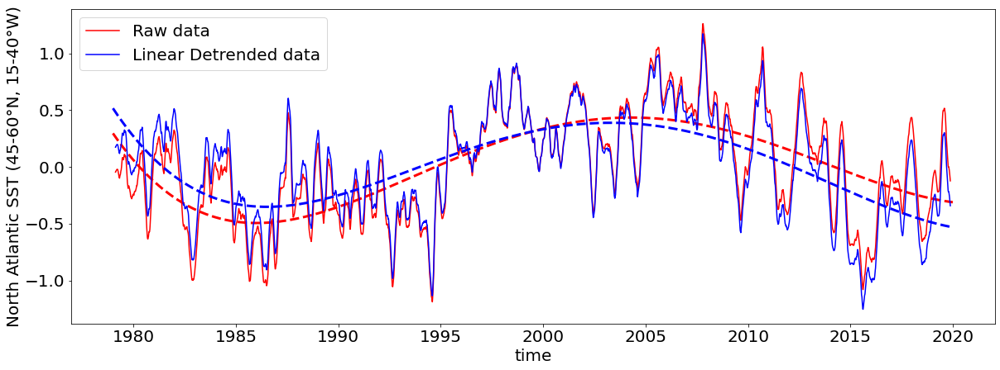

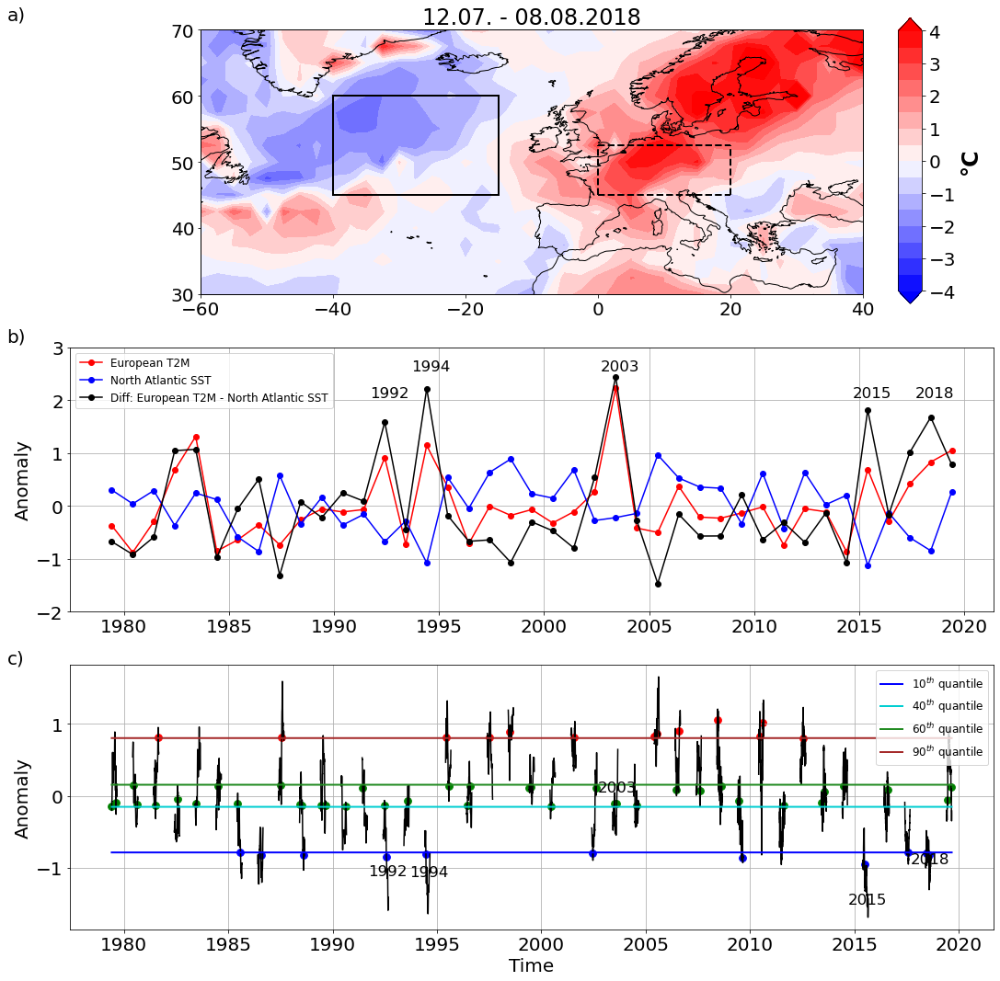

In [90]:
# Set general font size
plt.rcParams['font.size'] = '20'

########### Show the difference between the initial data and the detrended data with cdo or scipy.signal.detrend
x_JJA= range(len(sst_deseason_Atl_JJA.time))
x=range(14975)
sst_Atl_anom = sst_Atl - sst_Atl.mean('time')
z1 = np.polyfit(x,sst_Atl_anom , 4)
poly1 = np.poly1d(z1)
z2 = np.polyfit(x,sst_Atl_ds_dt_xr, 4)
poly2 = np.poly1d(z2)

rm_val = 90
sst_data = [sst_Atl_anom, xr.DataArray(sst_Atl_ds_dt_xr,dims=['time'], coords=dict(time=sst_Atl_anom.time))]
poly_data = [poly1, poly2]
color=['red','blue']
labels = ['Raw data','Linear Detrended data']
fig = plt.figure(figsize=(20,7))
for i in range(0,2):
    plt.plot(sst_Atl.rolling(time=rm_val, center=True).mean().dropna("time").time, sst_data[i].rolling(time=rm_val, center=True).mean().dropna("time"),color=color[i], label=labels[i])
    plt.plot(sst_Atl.time,poly_data[i](x),color=color[i], ls='--', lw=3)
    plt.ylabel('North Atlantic SST (45-60°N, 15-40°W)')
    plt.xlabel('time')
plt.legend()
plt.savefig('ERA5_SST_deseason_Atl_box_detrended_1979_2019.pdf')

fig = plt.figure(figsize=(18,18))
prj = ccrs.PlateCarree()
axs=[]
for i in range(1,4):
    if i==1:
        axs.append(fig.add_subplot(3,1,i, projection=prj))
    else:
        axs.append(fig.add_subplot(3,1,i))
levels= np.linspace(-4,4, 17)
X, Y = np.meshgrid(np.linspace(0,360, 145), ds_ERA5_SST.lat)
p1 = axs[0].contourf(X, Y,np.c_[sst_t2m_2018_JJA_anom, sst_t2m_2018_JJA_anom[:,0]], cmap='bwr', transform=prj,levels = levels, extend='both')
cb_ax = fig.add_axes([0.82, 0.65, 0.02, 0.24])
cb = fig.colorbar(p1, cax=cb_ax, orientation='vertical')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='°C', size='large', weight='bold')
axs[0].coastlines('50m')
axs[0].set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
axs[0].set_yticks([30,40, 50, 60, 70,80],crs=prj)
axs[0].set_title('12.07. - 08.08.2018')
axs[0].set_extent([-60, 40, 30, 70], ccrs.PlateCarree())
# Show SST boxes
x1, y1 = [-40, -15], [45, 45]
x2, y2 = [-40, -15], [60, 60]
x3, y3 = [-40, -40], [45, 60]
x4, y4 = [-15, -15], [45, 60]
axs[0].plot(x1, y1, x2, y2,x3,y3,x4,y4, color='black', linestyle='-', linewidth=2)
# Show T2M boxes
x1_E, y1_E = [0, 20], [45, 45]
x2_E, y2_E = [0, 20], [52.5, 52.5]
x3_E, y3_E = [0, 0], [45, 52.5]
x4_E, y4_E = [20, 20], [45, 52.5]
axs[0].plot(x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='--', linewidth=2)

years = [str(int(n)) for n in np.linspace(1979,2019,41)]
hw_years= ['1992','1994','2003','2015','2018']
sst_event_dots= [sst_deseason_Atl_JJA_lag0_10_concat, sst_deseason_Atl_JJA_lag0_90_concat, sst_deseason_Atl_JJA_lag0_40_60_concat]
color_dots= ['blue','red','green']
quantiles=[quantile_10, quantile_40, quantile_60, quantile_90]
color_lines= ['blue','darkturquoise', 'forestgreen', 'brown']
label= ['10','40','60','90']
for i in range(41):
    axs[2].plot(sst_deseason_Atl_JJA.time.sel(time=slice(years[i]+'-06-01T06:00:00', years[i]+'-08-31T06:00:00')), sst_deseason_Atl_JJA.sel(time=slice(years[i]+'-06-01T06:00:00', years[i]+'-08-31T06:00:00')),color='black')
for i in range(0,len(sst_event_dots)):
    axs[2].scatter(sst_event_dots[i].time, sst_event_dots[i], color=color_dots[i], s=60)
for i in range(0,len(quantiles)):
    axs[2].plot(sst_deseason_Atl_JJA.time, [quantiles[i]]*len(sst_deseason_Atl_JJA.time), color=color_lines[i], lw=2, label=label[i]+'$^{th}$ quantile')
for i in range(0,len(hw_years)):
    axs[2].text(sst_deseason_Atl_JJA.time.sel(time=slice(hw_years[i]+'-08-15T06:00:00',hw_years[i]+'-08-15T06:00:00')), sst_deseason_Atl_JJA.sel(time=slice(hw_years[i]+'-08-15T06:00:00',hw_years[i]+'-08-15T06:00:00')),hw_years[i], fontsize='small', horizontalalignment='center', verticalalignment='bottom')
#plt.title('Detrended data - only JJA values')
axs[2].set_ylabel('Anomaly')
#axs[1].set_xlabel('Time')
axs[2].legend(fontsize=12)
#plt.savefig('ERA5_SST_deseason_Atl_box_JJA_events_highlighted_detrended_1979_2019.pdf')
#plt.plot([1978,2020],[0,0], color='black', ls='--', lw=2)
#axs[1].plot(t2m_deseason_Euro_JJA_mean.time, t2m_deseason_Euro_JJA_mean,color='red')
axs[2].grid()

#for i in range(41):
#    axs[2].plot(t2m_deseason_Euro_JJA.time.sel(time=slice(years[i]+'-06-01T06:00:00', years[i]+'-08-31T06:00:00')), t2m_deseason_Euro_JJA.sel(time=slice(years[i]+'-06-01T06:00:00', years[i]+'-08-31T06:00:00')),color='black')
axs[1].grid()
axs[1].plot(t2m_deseason_Euro_JJA_mean.time, t2m_deseason_Euro_JJA_mean,color='red', marker='o', label='European T2M')
axs[1].plot(sst_deseason_Atl_JJA_mean.time, sst_deseason_Atl_JJA_mean,color='blue', marker='o', label= 'North Atlantic SST')
axs[1].plot(sst_deseason_Atl_JJA_mean.time, t2m_deseason_Euro_JJA_mean - sst_deseason_Atl_JJA_mean,color='black', marker='o', label='Diff: European T2M - North Atlantic SST')

axs[1].set_ylabel('Anomaly')
axs[2].set_xlabel('Time')
height=[2,2.5,2.5,2,2]
for i in range(0,len(hw_years)):
    axs[1].text(sst_deseason_Atl_JJA.time.sel(time=slice(hw_years[i]+'-08-15T06:00:00',hw_years[i]+'-08-15T06:00:00')), height[i],hw_years[i], fontsize='small', horizontalalignment='center', verticalalignment='bottom')
axs[1].set_ylim([-2, 3])
axs[1].legend(fontsize=12, loc=2)

#axs[1].plot([sst_deseason_Atl_JJA_mean.time[0],sst_deseason_Atl_JJA_mean.time[-1]],[0,0], color='black', ls='--', lw=2)
plt.figtext(0.08,0.9,"a)", ha="center", va="top", fontsize=20)
plt.figtext(0.08,0.63,"b)", ha="center", va="top", fontsize=20)
plt.figtext(0.08,0.36,"c)", ha="center", va="top", fontsize=20)

plt.savefig('ERA5_SST_T2M_ds_dt_Atl_Euro_box_JJA_detrended_1979_2019_diff.pdf')
#years = [str(int(n)) for n in np.linspace(1979,2019,41)]
#fig = plt.figure(figsize=(20,7))
#for i in range(len(sst_deseason_Atl_JJA_mean)):
#    if sst_deseason_Atl_JJA_mean[i] < -0.5:
#        plt.bar(years[i],sst_deseason_Atl_JJA_mean[i], color='blue')
#   elif sst_deseason_Atl_JJA_mean[i] > (quantile_90 - sst_Atl.mean('time')):
#        plt.bar(years[i],sst_deseason_Atl_JJA_mean[i], color='red')
#    else:
#        plt.bar(years[i],sst_deseason_Atl_JJA_mean[i], color='green')
#plt.xticks(years[1::5])
#plt.title('JJA seasonal mean values')
#plt.ylabel('North Atlantic SST anomaly (45-60°N, 15-40°W)')
#plt.xlabel('time')
#plt.savefig('ERA5_SST_deseason_Atl_box_raw_bar_plot.pdf')

## 4. Lead lag analysis plots: Define functions for ..
* Lat Lon Maps
* Lat Lead Hovmöller 
* Lon Lead Hovmöller
* Box averages - Line plots

In [10]:
def lead_lag(var, rm_value):
    # Detrend data set 
    var_detrend = signal.detrend(var, axis=0)
    # Produce xarray Data Array
    var_detrend_xr =  xr.DataArray(data=var_detrend, dims=["time", "lat", "lon"], coords=dict(lon = var.lon,lat= var.lat, time=var.time)) 
    # Deseasonalize
    var_ds_dt = var_detrend_xr.groupby("time.dayofyear") - (var_detrend_xr.groupby("time.dayofyear").mean("time") - var_detrend_xr.mean('time'))
    # Substract time mean
    var_anom = var_ds_dt - var_ds_dt.mean('time')

    #### Lead lag analysis without any mean
    lags = [str(int(n)) for n in np.linspace(-60,60,121)]
    var_10_lags=[]
    var_90_lags=[]
    var_medium_lags=[]
    for i in range(0,len(lags)):
        var_10_lags.append(var_anom.where(var_anom.time ==((sst_deseason_Atl_JJA_lag0_10_concat.time + pd.Timedelta(lags[i]+" days")).assign_coords(time=sst_deseason_Atl_JJA_lag0_10_concat.time + pd.Timedelta(lags[i]+" days")))))
        var_90_lags.append(var_anom.where(var_anom.time ==((sst_deseason_Atl_JJA_lag0_90_concat.time + pd.Timedelta(lags[i]+" days")).assign_coords(time=sst_deseason_Atl_JJA_lag0_90_concat.time + pd.Timedelta(lags[i]+" days")))))
        var_medium_lags.append(var_anom.where(var_anom.time ==((sst_deseason_Atl_JJA_lag0_40_60_concat.time + pd.Timedelta(lags[i]+" days")).assign_coords(time=sst_deseason_Atl_JJA_lag0_40_60_concat.time + pd.Timedelta(lags[i]+" days")))))
        var_10_lags[i].coords['lead_lag'] = int(lags[i])
        var_90_lags[i].coords['lead_lag'] = int(lags[i])
        var_medium_lags[i].coords['lead_lag'] = int(lags[i])
        
    var_10_lags_set = xr.DataArray(np.stack(var_10_lags, axis=0),dims=["lead_lag", "time", "lat","lon"],coords=dict(lead_lag= [int(n) for n in np.linspace(-60,60,121)], time=var_10_lags[60].time,lat= var_10_lags[0].lat,lon= var_10_lags[0].lon)).rolling(lead_lag=rm_value, center=True).mean().dropna("lead_lag")
    var_90_lags_set = xr.DataArray(np.stack(var_90_lags, axis=0),dims=["lead_lag", "time", "lat","lon"],coords=dict(lead_lag= [int(n) for n in np.linspace(-60,60,121)], time=var_90_lags[60].time,lat= var_90_lags[0].lat, lon= var_90_lags[0].lon)).rolling(lead_lag=rm_value, center=True).mean().dropna("lead_lag")
    var_medium_lags_set = xr.DataArray(np.stack(var_medium_lags, axis=0),dims=["lead_lag", "time", "lat","lon"],coords=dict(lead_lag= [int(n) for n in np.linspace(-60,60,121)], time=var_medium_lags[60].time,lat= var_medium_lags[0].lat, lon= var_medium_lags[0].lon)).rolling(lead_lag=rm_value, center=True).mean().dropna("lead_lag")

    var_lags_set= [var_10_lags_set, var_90_lags_set, var_medium_lags_set]
        
    return(var_lags_set)

def maps(var_lags_set, prob_th):
    # time mean -> maps
    var_lags_map= [var_lags_set[i].mean('time') for i in range(0,3)]
    # without time mean -> maps in terms of probability
    var_lags_map_wtm= [var_lags_set[i] for i in range(0,3)]
    var_lags_map_prob_pos = [(var_lags_map_wtm[i] > prob_th).sum(dim='time')/len(var_lags_map_wtm[i].time) for i in range(0,3)]
    var_lags_map_prob_neg = [(var_lags_map_wtm[i] < -prob_th).sum(dim='time')/len(var_lags_map_wtm[i].time) for i in range(0,3)]
    # t test for maps 
    var_lags_map_welch = [xr.DataArray(ttest_ind(var_lags_set[0], var_lags_set[2], axis=1, equal_var=False).pvalue,dims=["lead_lag", "lat","lon"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lat= var_lags_set[0].lat,lon= var_lags_set[0].lon)), xr.DataArray(ttest_ind(var_lags_set[1], var_lags_set[2], axis=1, equal_var=False).pvalue,dims=["lead_lag", "lat","lon"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lat= var_lags_set[0].lat,lon= var_lags_set[0].lon))]
    return (var_lags_map,var_lags_map_wtm, var_lags_map_prob_pos,var_lags_map_prob_neg, var_lags_map_welch)
    
def hov_lat_lead(var_lags_set, prob_th):   
    # lon mean -> Hovmöller lat vs lead plots
    var_lags_Atl_lat_lead = [var_lags_set[i].sel(lon=slice(320.0, 345.0)).mean('lon').mean('time') for i in range(0,3)]
    var_lags_Euro_lat_lead = [var_lags_set[i].sel(lon=slice(0.0, 20.0)).mean('lon').mean('time') for i in range(0,3)]
    # without time mean -> Hovmöller plots in terms of probability
    var_lags_Atl_lat_lead_wtm = [var_lags_set[i].sel(lon=slice(320.0, 345.0)).mean('lon') for i in range(0,3)]
    var_lags_Euro_lat_lead_wtm = [var_lags_set[i].sel(lon=slice(0.0, 20.0)).mean('lon') for i in range(0,3)]
    var_lags_Atl_lat_lead_prob_pos = [(var_lags_Atl_lat_lead_wtm[i] > prob_th).sum(dim='time')/len(var_lags_Atl_lat_lead_wtm[i].time) for i in range(0,3)]
    var_lags_Atl_lat_lead_prob_neg = [(var_lags_Atl_lat_lead_wtm[i] < -prob_th).sum(dim='time')/len(var_lags_Atl_lat_lead_wtm[i].time) for i in range(0,3)]
    var_lags_Euro_lat_lead_prob_pos = [(var_lags_Euro_lat_lead_wtm[i] > prob_th).sum(dim='time')/len(var_lags_Euro_lat_lead_wtm[i].time) for i in range(0,3)]
    var_lags_Euro_lat_lead_prob_neg = [(var_lags_Euro_lat_lead_wtm[i] < -prob_th).sum(dim='time')/len(var_lags_Euro_lat_lead_wtm[i].time) for i in range(0,3)]
    # t test
    var_lags_Atl_lat_lead_welch = [xr.DataArray(ttest_ind(var_lags_set[0].sel(lon=slice(320.0, 345.0)).mean('lon'), var_lags_set[2].sel(lon=slice(320.0, 345.0)).mean('lon'), axis=1, equal_var=False).pvalue,dims=["lead_lag", "lat"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lat= var_lags_Atl_lat_lead[0].lat)), xr.DataArray(ttest_ind(var_lags_set[1].sel(lon=slice(320.0, 345.0)).mean('lon'), var_lags_set[2].sel(lon=slice(320.0, 345.0)).mean('lon'), axis=1, equal_var=False).pvalue,dims=["lead_lag", "lat"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lat= var_lags_Atl_lat_lead[0].lat))]
    var_lags_Euro_lat_lead_welch = [xr.DataArray(ttest_ind(var_lags_set[0].sel(lon=slice(0.0, 20.0)).mean('lon'), var_lags_set[2].sel(lon=slice(0.0, 20.0)).mean('lon'), axis=1, equal_var=False).pvalue,dims=["lead_lag", "lat"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lat= var_lags_Atl_lat_lead[0].lat)), xr.DataArray(ttest_ind(var_lags_set[1].sel(lon=slice(0.0, 20.0)).mean('lon'), var_lags_set[2].sel(lon=slice(0.0, 20.0)).mean('lon'), axis=1, equal_var=False).pvalue,dims=["lead_lag", "lat"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lat= var_lags_Atl_lat_lead[0].lat))]
    return(var_lags_Atl_lat_lead, var_lags_Euro_lat_lead, var_lags_Atl_lat_lead_prob_pos,var_lags_Atl_lat_lead_prob_neg, var_lags_Euro_lat_lead_prob_pos,var_lags_Euro_lat_lead_prob_neg, var_lags_Atl_lat_lead_welch, var_lags_Euro_lat_lead_welch)

def hov_lon_lead(var_lags_set, prob_th):    
    # lon mean -> Hovmöller lon vs lead plots
    var_lags_lon_lead = [var_lags_set[i].sel(lat=slice(60.0, 40.0)).mean('lat').mean('time') for i in range(0,3)]
    # without time mean -> Hovmöller plots in terms of probability
    var_lags_lon_lead_wtm = [var_lags_set[i].sel(lat=slice(60.0, 40.0)).mean('lat') for i in range(0,3)]
    var_lags_lon_lead_prob_pos = [(var_lags_lon_lead_wtm[i] > prob_th).sum(dim='time')/len(var_lags_lon_lead_wtm[i].time) for i in range(0,3)]
    var_lags_lon_lead_prob_neg = [(var_lags_lon_lead_wtm[i] < -prob_th).sum(dim='time')/len(var_lags_lon_lead_wtm[i].time) for i in range(0,3)]
    # t test
    var_lags_lon_lead_welch = [xr.DataArray(ttest_ind(var_lags_set[0].sel(lat=slice(60.0, 40.0)).mean('lat'), var_lags_set[2].sel(lat=slice(60.0, 40.0)).mean('lat'), axis=1, equal_var=False).pvalue,dims=["lead_lag", "lon"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lon= var_lags_lon_lead[0].lon)), xr.DataArray(ttest_ind(var_lags_set[1].sel(lat=slice(60.0, 40.0)).mean('lat'), var_lags_set[2].sel(lat=slice(60.0, 40.0)).mean('lat'), axis=1, equal_var=False).pvalue,dims=["lead_lag", "lon"],coords=dict(lead_lag= var_lags_set[0].lead_lag,lon= var_lags_lon_lead[0].lon))]
    return(var_lags_lon_lead, var_lags_lon_lead_prob_pos,var_lags_lon_lead_prob_neg, var_lags_lon_lead_welch)
def lines(var_lags_set, prob_th):    
    # lon & lat means -> line plots
    var_lags_Atl_line= [var_lags_set[i].sel(lon=slice(320.0, 345.0), lat=slice(60.0,45.0)).mean('lon').mean('lat', skipna=True).mean('time') for i in range(0,3)]
    var_lags_Euro_line= [var_lags_set[i].sel(lon=slice(0.0, 20.0), lat=slice(52.5,45.0)).mean('lon').mean('lat').mean('time') for i in range(0,3)]
    # without time mean -> Box average line plots in terms of probability
    var_lags_Atl_line_wtm= [var_lags_set[i].sel(lon=slice(320.0, 345.0), lat=slice(60.0,45.0)).mean('lon').mean('lat') for i in range(0,3)]
    var_lags_Euro_line_wtm= [var_lags_set[i].sel(lon=slice(0.0, 20.0), lat=slice(52.5,45.0)).mean('lon').mean('lat') for i in range(0,3)]
    var_lags_Atl_line_prob_pos = [(var_lags_Atl_line_wtm[i] > prob_th).sum(dim='time')/len(var_lags_Atl_line_wtm[i].time) for i in range(0,3)]
    var_lags_Atl_line_prob_neg= [(var_lags_Atl_line_wtm[i] < -prob_th).sum(dim='time')/len(var_lags_Atl_line_wtm[i].time) for i in range(0,3)]
    var_lags_Euro_line_prob_pos = [(var_lags_Euro_line_wtm[i] > prob_th).sum(dim='time')/len(var_lags_Euro_line_wtm[i].time) for i in range(0,3)]
    var_lags_Euro_line_prob_neg = [(var_lags_Euro_line_wtm[i] < -prob_th).sum(dim='time')/len(var_lags_Euro_line_wtm[i].time) for i in range(0,3)]
        
    var_lags_Atl_line_welch = [xr.DataArray(ttest_ind(var_lags_Atl_line_wtm[0], var_lags_Atl_line_wtm[2], axis=1, equal_var=False).pvalue,dims=["lead_lag"],coords=dict(lead_lag= var_lags_set[0].lead_lag)), xr.DataArray(ttest_ind(var_lags_Atl_line_wtm[1], var_lags_Atl_line_wtm[2], axis=1, equal_var=False).pvalue,dims=["lead_lag"],coords=dict(lead_lag= var_lags_set[0].lead_lag))]
    var_lags_Euro_line_welch = [xr.DataArray(ttest_ind(var_lags_Euro_line_wtm[0], var_lags_Euro_line_wtm[2], axis=1, equal_var=False).pvalue,dims=["lead_lag"],coords=dict(lead_lag= var_lags_set[0].lead_lag)), xr.DataArray(ttest_ind(var_lags_Euro_line_wtm[1], var_lags_Euro_line_wtm[2], axis=1, equal_var=False).pvalue,dims=["lead_lag"],coords=dict(lead_lag= var_lags_set[0].lead_lag))]

    return(var_lags_Atl_line,var_lags_Euro_line,var_lags_Atl_line_wtm,var_lags_Euro_line_wtm, var_lags_Atl_line_prob_pos,var_lags_Atl_line_prob_neg, var_lags_Euro_line_prob_pos,var_lags_Euro_line_prob_neg, var_lags_Atl_line_welch,var_lags_Euro_line_welch)


## 5. Use functions for different parameters
* SST & T2M

In [11]:
prob_th_sst_t2m = 0  # <- set thresholds for probability selection

sst_t2m = ds_ERA5_SST_old.var34.where(ds_ERA5_SST_old.var34 >= -8.999999873090293e+33, ds_ERA5_T2M.var167)
SST_T2M =  xr.DataArray(data=sst_t2m, dims=["time", "lat", "lon"], coords=dict(lon = ds_ERA5_SST.lon,lat= ds_ERA5_SST.lat, time=ds_ERA5_SST.time))                                                                                               
sst_t2m_lags_set = lead_lag(SST_T2M,7) # <- set days for running mean !!!
sst_t2m_map,sst_t2m_map_wtm, sst_t2m_map_prob_pos,sst_t2m_map_prob_neg, sst_t2m_map_welch = maps(sst_t2m_lags_set, prob_th_sst_t2m) # <- set thresholds for probability selection
sst_t2m_Atl_lat_lead, sst_t2m_Euro_lat_lead,sst_t2m_Atl_lat_lead_prob_pos, sst_t2m_Atl_lat_lead_prob_neg, sst_t2m_Euro_lat_lead_prob_pos,sst_t2m_Euro_lat_lead_prob_neg, sst_t2m_Atl_lat_lead_welch, sst_t2m_Euro_lat_lead_welch = hov_lat_lead(sst_t2m_lags_set, prob_th_sst_t2m)
sst_t2m_lon_lead, sst_t2m_lon_lead_prob_pos, sst_t2m_lon_lead_prob_neg, sst_t2m_lon_lead_welch = hov_lon_lead(sst_t2m_lags_set, prob_th_sst_t2m)
sst_t2m_Atl_line, sst_t2m_Euro_line,sst_t2m_Atl_line_wtm, sst_t2m_Euro_line_wtm, sst_t2m_Atl_line_prob_pos, sst_t2m_Atl_line_prob_neg, sst_t2m_Euro_line_prob_pos, sst_t2m_Euro_line_prob_neg,sst_t2m_Atl_line_welch, sst_t2m_Euro_line_welch  = lines(sst_t2m_lags_set, prob_th_sst_t2m)

print(sst_t2m_map_wtm[0].shape)
print(sst_t2m_Euro_line_welch[0].shape)

(115, 11, 73, 144)
(115,)


* Z300

In [12]:
prob_th_z = 0  # <- set thresholds for probability selection

z300 = xr.DataArray(ds_ERA5_z.z,dims=["time", "lat","lon"],coords=dict(time=SST_T2M.time,lat= SST_T2M.lat,lon= SST_T2M.lon))/9.81 
z_lags_set = lead_lag(z300,7) # <- set days for running mean !!!
z_map,z_map_wtm, z_map_prob_pos, z_map_prob_neg, z_map_welch = maps(z_lags_set,prob_th_z) 
z_Atl_lat_lead, z_Euro_lat_lead, z_Atl_lat_lead_prob_pos, z_Atl_lat_lead_prob_neg, z_Euro_lat_lead_prob_pos, z_Euro_lat_lead_prob_neg, z_Atl_lat_lead_welch, z_Euro_lat_lead_welch = hov_lat_lead(z_lags_set,prob_th_z)
z_lon_lead,z_lon_lead_prob_pos, z_lon_lead_prob_neg, z_lon_lead_welch = hov_lon_lead(z_lags_set,prob_th_z)
z_Atl_line, z_Euro_line,z_Atl_line_wtm, z_Euro_line_wtm, z_Atl_line_prob_pos, z_Atl_line_prob_neg, z_Euro_line_prob_pos, z_Euro_line_prob_neg, z_Atl_line_welch, z_Euro_line_welch = lines(z_lags_set,prob_th_z)

print(z_map_wtm[0].shape)
print(z_Euro_line_welch[0].shape)

(115, 11, 73, 144)
(115,)


* Surface latent heat flux

In [18]:
prob_th_lhf = 0  # <- set thresholds for probability selection

lhf = ds_ERA5_lathf.var147/3600 # <- convert from J/m^2 to W/m^2 (60 sec x 60 mins = 3600s)
lhf_lags_set = lead_lag(lhf,7) # <- set days for running mean !!!
lhf_map,lhf_map_wtm, lhf_map_prob_pos, lhf_map_prob_neg, lhf_map_welch = maps(lhf_lags_set,prob_th_lhf) 
lhf_Atl_lat_lead, lhf_Euro_lat_lead, lhf_Atl_lat_lead_prob_pos, lhf_Atl_lat_lead_prob_neg, lhf_Euro_lat_lead_prob_pos, lhf_Euro_lat_lead_prob_neg, lhf_Atl_lat_lead_welch, lhf_Euro_lat_lead_welch = hov_lat_lead(lhf_lags_set,prob_th_lhf)
lhf_lon_lead, lhf_lon_lead_prob_pos, lhf_lon_lead_prob_neg, lhf_lon_lead_welch = hov_lon_lead(lhf_lags_set,prob_th_lhf)
lhf_Atl_line, lhf_Euro_line, lhf_Atl_line_wtm, lhf_Euro_line_wtm, lhf_Atl_line_prob_pos, lhf_Atl_line_prob_neg, lhf_Euro_line_prob_pos, lhf_Euro_line_prob_neg, lhf_Atl_line_welch, lhf_Euro_line_welch = lines(lhf_lags_set,prob_th_lhf)

print(lhf_map_prob_pos[0].shape)
print(lhf_Atl_lat_lead_prob_pos[0].shape)
print(lhf_lon_lead_prob_pos[0].shape)
print(lhf_Atl_line_prob_pos[0].shape)

(115, 73, 144)
(115, 73)
(115, 144)
(115,)


* Surface sensible heat flux

In [19]:
prob_th_shf = 0  # <- set thresholds for probability selection

shf = ds_ERA5_senhf.var146/3600 # <- convert from J/m^2 to W/m^2 (60 sec x 60 mins =3600s)
shf_lags_set = lead_lag(shf,7) # <- set days for running mean !!!
shf_map,shf_map_wtm, shf_map_prob_pos, shf_map_prob_neg, shf_map_welch = maps(shf_lags_set,prob_th_shf) 
shf_Atl_lat_lead, shf_Euro_lat_lead, shf_Atl_lat_lead_prob_pos, shf_Atl_lat_lead_prob_neg, shf_Euro_lat_lead_prob_pos, shf_Euro_lat_lead_prob_neg, shf_Atl_lat_lead_welch, shf_Euro_lat_lead_welch = hov_lat_lead(shf_lags_set,prob_th_shf)
shf_lon_lead, shf_lon_lead_prob_pos, shf_lon_lead_prob_neg, shf_lon_lead_welch = hov_lon_lead(lhf_lags_set,prob_th_shf)
shf_Atl_line, shf_Euro_line,shf_Atl_line_wtm, shf_Euro_line_wtm, shf_Atl_line_prob_pos, shf_Atl_line_prob_neg, shf_Euro_line_prob_pos, shf_Euro_line_prob_neg, shf_Atl_line_welch, shf_Euro_line_welch = lines(shf_lags_set,prob_th_shf)

print(shf_map_prob_pos[0].shape)
print(shf_Atl_lat_lead_prob_pos[0].shape)
print(shf_lon_lead_prob_pos[0].shape)
print(shf_Atl_line_prob_pos[0].shape)

(115, 73, 144)
(115, 73)
(115, 144)
(115,)


* Total cloud cover

In [20]:
prob_th_tcc = 0  # <- set thresholds for probability selection

tcc = ds_ERA5_tcc.tcc
tcc_lags_set = lead_lag(tcc,7) # <- set days for running mean !!!
tcc_map, tcc_map_wtm, tcc_map_prob_pos,tcc_map_prob_neg, tcc_map_welch = maps(tcc_lags_set,prob_th_tcc) 
tcc_Atl_lat_lead, tcc_Euro_lat_lead, tcc_Atl_lat_lead_prob_pos,tcc_Atl_lat_lead_prob_neg, tcc_Euro_lat_lead_prob_pos, tcc_Euro_lat_lead_prob_neg, tcc_Atl_lat_lead_welch, tcc_Euro_lat_lead_welch = hov_lat_lead(tcc_lags_set,prob_th_tcc)
tcc_lon_lead, tcc_lon_lead_prob_pos, tcc_lon_lead_prob_neg, tcc_lon_lead_welch = hov_lon_lead(tcc_lags_set,prob_th_tcc)
tcc_Atl_line, tcc_Euro_line,tcc_Atl_line_wtm, tcc_Euro_line_wtm, tcc_Atl_line_prob_pos, tcc_Atl_line_prob_neg, tcc_Euro_line_prob_pos, tcc_Euro_line_prob_neg, tcc_Atl_line_welch, tcc_Euro_line_welch = lines(tcc_lags_set,prob_th_tcc)

print(tcc_map_prob_pos[0].shape)
print(tcc_Atl_lat_lead_prob_pos[0].shape)
print(tcc_lon_lead_prob_pos[0].shape)
print(tcc_Atl_line_prob_pos[0].shape)

(115, 73, 144)
(115, 73)
(115, 144)
(115,)


* Large scale precipitation

In [221]:
prob_th_lsp = 0  # <- set thresholds for probability selection

lsp = ds_ERA5_lsp.var142*1000 # <- convert from m to mm
lsp_lags_set = lead_lag(lsp,7) # <- set days for running mean !!!
lsp_map, lsp_map_prob_pos,lsp_map_prob_neg, lsp_map_welch = maps(lsp_lags_set,prob_th_lsp) 
lsp_Atl_lat_lead, lsp_Euro_lat_lead, lsp_Atl_lat_lead_prob_pos,lsp_Atl_lat_lead_prob_neg, lsp_Euro_lat_lead_prob_pos, lsp_Euro_lat_lead_prob_neg, lsp_Atl_lat_lead_welch, lsp_Euro_lat_lead_welch = hov_lat_lead(lsp_lags_set,prob_th_lsp)
lsp_lon_lead, lsp_lon_lead_prob_pos, lsp_lon_lead_prob_neg, lsp_lon_lead_welch = hov_lon_lead(lsp_lags_set,prob_th_lsp)
lsp_Atl_line, lsp_Euro_line, lsp_Atl_line_prob_pos, lsp_Atl_line_prob_neg, lsp_Euro_line_prob_pos, lsp_Euro_line_prob_neg, lsp_Atl_line_welch, lsp_Euro_line_welch = lines(lsp_lags_set,prob_th_lsp)

print(lsp_map_prob_pos[0].shape)
print(lsp_Atl_lat_lead_prob_pos[0].shape)
print(lsp_lon_lead_prob_pos[0].shape)
print(lsp_Atl_line_prob_pos[0].shape)

NameError: name 'ds_ERA5_lsp' is not defined

* Convective precipitation

In [222]:
prob_th_cp = 0  # <- set thresholds for probability selection

cp = ds_ERA5_cp.var143*1000 # <- convert from m to mm
cp_lags_set = lead_lag(cp,7) # <- set days for running mean !!!
cp_map, cp_map_prob_pos,cp_map_prob_neg, cp_map_welch = maps(cp_lags_set,prob_th_cp) 
cp_Atl_lat_lead, cp_Euro_lat_lead, cp_Atl_lat_lead_prob_pos,cp_Atl_lat_lead_prob_neg, cp_Euro_lat_lead_prob_pos, cp_Euro_lat_lead_prob_neg, cp_Atl_lat_lead_welch, cp_Euro_lat_lead_welch = hov_lat_lead(cp_lags_set,prob_th_cp)
cp_lon_lead, cp_lon_lead_prob_pos, cp_lon_lead_prob_neg, cp_lon_lead_welch = hov_lon_lead(cp_lags_set,prob_th_cp)
cp_Atl_line, cp_Euro_line, cp_Atl_line_prob_pos, cp_Atl_line_prob_neg, cp_Euro_line_prob_pos, cp_Euro_line_prob_neg, cp_Atl_line_welch, cp_Euro_line_welch = lines(cp_lags_set,prob_th_cp)

print(cp_map_prob_pos[0].shape)
print(cp_Atl_lat_lead_prob_pos[0].shape)
print(cp_lon_lead_prob_pos[0].shape)
print(cp_Atl_line_prob_pos[0].shape)

NameError: name 'ds_ERA5_cp' is not defined

* Surface net solar radiation

In [21]:
prob_th_snsr = 0  # <- set thresholds for probability selection

snsr = ds_ERA5_snsr.ssr/3600 # <- convert from J/m^2 to W/m^2 (60 sec x 60 mins =3600s)
snsr_lags_set = lead_lag(snsr,7) # <- set days for running mean !!!
snsr_map, snsr_map_wtm, snsr_map_prob_pos,snsr_map_prob_neg, snsr_map_welch = maps(snsr_lags_set,prob_th_snsr) 
snsr_Atl_lat_lead, snsr_Euro_lat_lead, snsr_Atl_lat_lead_prob_pos,snsr_Atl_lat_lead_prob_neg, snsr_Euro_lat_lead_prob_pos, snsr_Euro_lat_lead_prob_neg, snsr_Atl_lat_lead_welch, snsr_Euro_lat_lead_welch = hov_lat_lead(snsr_lags_set,prob_th_snsr)
snsr_lon_lead, snsr_lon_lead_prob_pos, snsr_lon_lead_prob_neg, snsr_lon_lead_welch = hov_lon_lead(snsr_lags_set,prob_th_snsr)
snsr_Atl_line, snsr_Euro_line,snsr_Atl_line_wtm, snsr_Euro_line_wtm, snsr_Atl_line_prob_pos, snsr_Atl_line_prob_neg, snsr_Euro_line_prob_pos, snsr_Euro_line_prob_neg, snsr_Atl_line_welch, snsr_Euro_line_welch = lines(snsr_lags_set,prob_th_snsr)

print(snsr_map_prob_pos[0].shape)
print(snsr_Atl_lat_lead_prob_pos[0].shape)
print(snsr_lon_lead_prob_pos[0].shape)
print(snsr_Atl_line_prob_pos[0].shape)

(115, 73, 144)
(115, 73)
(115, 144)
(115,)


* Surface net thermal radiation

In [22]:
prob_th_sntr = 0  # <- set thresholds for probability selection

sntr = ds_ERA5_sntr.str/3600 # <- convert from J/m^2 to W/m^2 (60 sec x 60 mins =3600s)
sntr_lags_set = lead_lag(sntr,7) # <- set days for running mean !!!
sntr_map, sntr_map_wtm, sntr_map_prob_pos,sntr_map_prob_neg, sntr_map_welch = maps(sntr_lags_set,prob_th_sntr) 
sntr_Atl_lat_lead, sntr_Euro_lat_lead, sntr_Atl_lat_lead_prob_pos,sntr_Atl_lat_lead_prob_neg, sntr_Euro_lat_lead_prob_pos, sntr_Euro_lat_lead_prob_neg, sntr_Atl_lat_lead_welch, sntr_Euro_lat_lead_welch = hov_lat_lead(sntr_lags_set,prob_th_sntr)
sntr_lon_lead, sntr_lon_lead_prob_pos, sntr_lon_lead_prob_neg, sntr_lon_lead_welch = hov_lon_lead(sntr_lags_set,prob_th_sntr)
sntr_Atl_line, sntr_Euro_line,sntr_Atl_line_wtm, sntr_Euro_line_wtm, sntr_Atl_line_prob_pos, sntr_Atl_line_prob_neg, sntr_Euro_line_prob_pos, sntr_Euro_line_prob_neg, sntr_Atl_line_welch, sntr_Euro_line_welch = lines(sntr_lags_set,prob_th_sntr)

print(sntr_map_prob_pos[0].shape)
print(sntr_Atl_lat_lead_prob_pos[0].shape)
print(sntr_lon_lead_prob_pos[0].shape)
print(sntr_Atl_line_prob_pos[0].shape)

(115, 73, 144)
(115, 73)
(115, 144)
(115,)


* Geopotential - Rossby wave packets

In [13]:
prob_th_z_RWP = 0  # <- set thresholds for probability selection

z_RWP  = np.nan_to_num(ds_ERA5_z_PW_RWP.filt_RWP, nan=0.0) # <- fill nan values with zeros
z_RWP = xr.DataArray(z_RWP,dims=["time", "lat","lon"],coords=dict(time=SST_T2M.time,lat= SST_T2M.lat,lon= SST_T2M.lon))/9.81
z_RWP_lags_set = lead_lag(z_RWP,7) # <- set days for running mean !!!
z_RWP_map, z_RWP_map_wtm, z_RWP_map_prob_pos,z_RWP_map_prob_neg, z_RWP_map_welch = maps(z_RWP_lags_set,prob_th_z_RWP) 
z_RWP_Atl_lat_lead, z_RWP_Euro_lat_lead, z_RWP_Atl_lat_lead_prob_pos,z_RWP_Atl_lat_lead_prob_neg, z_RWP_Euro_lat_lead_prob_pos, z_RWP_Euro_lat_lead_prob_neg, z_RWP_Atl_lat_lead_welch, z_RWP_Euro_lat_lead_welch = hov_lat_lead(z_RWP_lags_set,prob_th_z_RWP)
z_RWP_lon_lead, z_RWP_lon_lead_prob_pos, z_RWP_lon_lead_prob_neg, z_RWP_lon_lead_welch = hov_lon_lead(z_RWP_lags_set,prob_th_z_RWP)
z_RWP_Atl_line, z_RWP_Euro_line, z_RWP_Atl_line_wtm, z_RWP_Euro_line_wtm, z_RWP_Atl_line_prob_pos, z_RWP_Atl_line_prob_neg, z_RWP_Euro_line_prob_pos, z_RWP_Euro_line_prob_neg, z_RWP_lags_Atl_line_welch, z_RWP_lags_Atl_line_welch = lines(z_RWP_lags_set,prob_th_z_RWP)

print(z_RWP_map_prob_pos[0].shape)
print(z_RWP_Atl_lat_lead_prob_pos[0].shape)
print(z_RWP_lon_lead_prob_pos[0].shape)
print(z_RWP_Atl_line[0].shape)

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


(115, 73, 144)
(115, 73)
(115, 144)
(115,)


* Geopotential - Planetary Waves

In [14]:
prob_th_z_PW = 0  # <- set thresholds for probability selection

z_PW  = np.nan_to_num(ds_ERA5_z_PW_RWP.filt_PW, nan=0.0) # <- fill nan values with zeros
z_PW = xr.DataArray(z_PW,dims=["time", "lat","lon"],coords=dict(time=SST_T2M.time,lat= SST_T2M.lat,lon= SST_T2M.lon))/9.81
z_PW_lags_set = lead_lag(z_PW,7) # <- set days for running mean !!!
z_PW_map, z_PW_map_wtm, z_PW_map_prob_pos,z_PW_map_prob_neg, z_PW_map_welch = maps(z_PW_lags_set,prob_th_z_PW) 
z_PW_Atl_lat_lead, z_PW_Euro_lat_lead, z_PW_Atl_lat_lead_prob_pos,z_PW_Atl_lat_lead_prob_neg, z_PW_Euro_lat_lead_prob_pos, z_PW_Euro_lat_lead_prob_neg, z_PW_Atl_lat_lead_welch, z_PW_Euro_lat_lead_welch = hov_lat_lead(z_PW_lags_set,prob_th_z_PW)
z_PW_lon_lead, z_PW_lon_lead_prob_pos, z_PW_lon_lead_prob_neg, z_PW_lon_lead_welch = hov_lon_lead(z_PW_lags_set,prob_th_z_PW)
z_PW_Atl_line, z_PW_Euro_line,z_PW_Atl_line_wtm, z_PW_Euro_line_wtm, z_PW_Atl_line_prob_pos, z_PW_Atl_line_prob_neg, z_PW_Euro_line_prob_pos, z_PW_Euro_line_prob_neg, z_PW_lags_Atl_line_welch, z_PW_lags_Atl_line_welch = lines(z_PW_lags_set,prob_th_z_PW)

print(z_PW_map_prob_pos[0].shape)
print(z_PW_Atl_lat_lead_prob_pos[0].shape)
print(z_PW_lon_lead_prob_pos[0].shape)
print(z_PW_Atl_line[0].shape)

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1932: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


(115, 73, 144)
(115, 73)
(115, 144)
(115,)


# Plot Distribution of all SST and T2M JJA values (3772) and composite dates

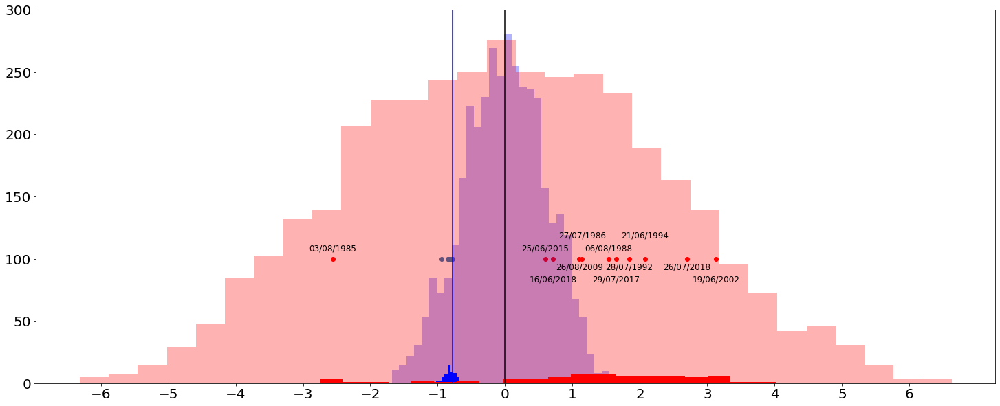

In [79]:
fig = plt.figure(figsize=(25,10))
n, bins,patches= plt.hist(sst_deseason_Atl_JJA, color='blue', bins=30, alpha = 0.3)
n, bins,patches= plt.hist(t2m_deseason_Euro_JJA, color='red', bins=30, alpha = 0.3)
plt.scatter(sst_deseason_Atl_JJA_lag0_10_concat,np.full((11), 100))
plt.plot([0,0],[0,300], color='black')
plt.ylim([0,300])
#plt.xlim([-1,-0.75])
plt.plot([quantile_10, quantile_10],[0,300], color='blue')
plt.xticks([-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6])
lag=3
plt.scatter(sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(lag,lag)).squeeze(),np.full((11), 100), color='red')
df=sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(lag,lag)).squeeze()
dy=[105,115,105,90,115,80,90,105,80,80,90,105]
dates_t2m =df.time.dt.strftime("%d/%m/%Y")
for i in range(0,len(dates_t2m)):
    plt.text(df[i],dy[i],dates_t2m.values[i], fontsize=12, horizontalalignment='center', verticalalignment='bottom')
    
##### Histograms for composites
# for SST between -2 and +2
sst_comb= [sst_t2m_Atl_line_wtm[0].sel(lead_lag=slice(-2,-2)).squeeze(),sst_t2m_Atl_line_wtm[0].sel(lead_lag=slice(-1,-1)).squeeze(),sst_t2m_Atl_line_wtm[0].sel(lead_lag=slice(0,0)).squeeze(),sst_t2m_Atl_line_wtm[0].sel(lead_lag=slice(1,1)).squeeze(),sst_t2m_Atl_line_wtm[0].sel(lead_lag=slice(2,2)).squeeze()]
sst_cat = xr.concat(sst_comb, dim='time')

# for T2M between -2 and +7
t2m_comb= [sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(2,2)).squeeze(),sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(3,3)).squeeze(),sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(4,4)).squeeze(),sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(5,5)).squeeze(),sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(6,6)).squeeze(),sst_t2m_Euro_line_wtm[0].sel(lead_lag=slice(7,7)).squeeze()]
t2m_cat = xr.concat(t2m_comb, dim='time')
plt.hist(sst_cat, bins=10, color='blue')
plt.hist(t2m_cat, bins=20, color='red')


# Save JJA to netCDF file
ds = xr.Dataset({"sst_t2m_Atl_line_wtm_downstream": (("lead_lag","time"), sst_t2m_Atl_line_wtm[0]),"sst_t2m_Euro_line_wtm_downstream": (("lead_lag","time"), sst_t2m_Euro_line_wtm[0]), "sst_deseason_Atl_JJA_lag0_10_concat_downstream": (("time"),sst_deseason_Atl_JJA_lag0_10_concat)},coords={"lead_lag": sst_t2m_Euro_line_wtm[0].lead_lag,"time": sst_t2m_Euro_line_wtm[0].time},)
#ds.attrs['title'] = ['Total wind speed 300 hPa JJA']
ds.to_netcdf('ERA5_downstream_analysis_composite_dates.nc')

ds = xr.Dataset({"sst_t2m_Atl_line_wtm_downstream_warm": (("lead_lag","time"), sst_t2m_Atl_line_wtm[1]),"sst_t2m_Euro_line_wtm_downstream_warm": (("lead_lag","time"), sst_t2m_Euro_line_wtm[1]), "sst_deseason_Atl_JJA_lag0_90_concat_downstream": (("time"),sst_deseason_Atl_JJA_lag0_90_concat)},coords={"lead_lag": sst_t2m_Euro_line_wtm[1].lead_lag,"time": sst_t2m_Euro_line_wtm[1].time},)
#ds.to_netcdf('ERA5_downstream_analysis_composite_dates_warm_composite.nc')

# Plot Maps

In [34]:
# Set p-value thresholds:
upp_p_val=0.1
low_p_val=0.05

In [16]:
# Change colormaps
white = np.array([1., 1., 1., 1.])

################
BuPu = plt.cm.get_cmap('BuPu', 256)
BuPu_white = BuPu(np.linspace(0, 1, 256))
BuPu_white[0:28, :] = white
BuPu_white_cm= ListedColormap(BuPu_white)
################
afmhot_reversed = plt.cm.get_cmap('afmhot',256).reversed()
afmhot_reversed_white = afmhot_reversed(np.linspace(0, 1, 256))
afmhot_reversed_white[0:28, :] = white
afmhot_reversed_white_cm= ListedColormap(afmhot_reversed_white)
###############
seismic = plt.cm.get_cmap('seismic', 256)
seismic_white = seismic(np.linspace(0, 1, 256))
seismic_white[118:136, :] = white
seismic_white_cm= ListedColormap(seismic_white)

### SST/T2M anomalies (coloured and Z300 anomalies (contours) based on ALL COLD SST composites

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


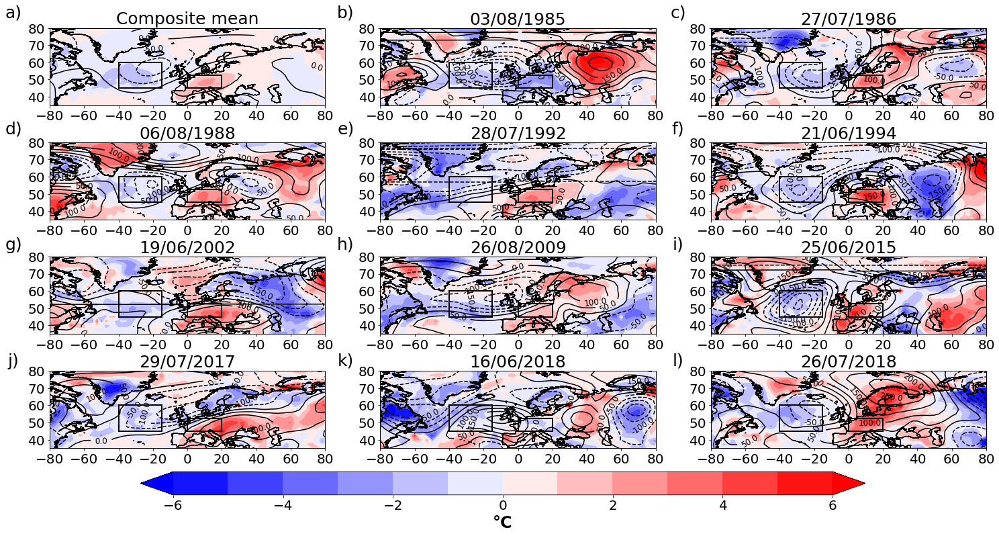

In [90]:
# Set general font size
plt.rcParams['font.size'] = '20'

##### Show Atlantic boxes
x1, y1 = [-40, -15], [45, 45]
x2, y2 = [-40, -15], [60, 60]
x3, y3 = [-40, -40], [45, 60]
x4, y4 = [-15, -15], [45, 60]

# Show T2M boxes
x1_E, y1_E = [0, 20], [45, 45]
x2_E, y2_E = [0, 20], [52.5, 52.5]
x3_E, y3_E = [0, 0], [45, 52.5]
x4_E, y4_E = [20, 20], [45, 52.5]

sst_t2m_map_wtm_lag5 = sst_t2m_map_wtm[0].sel(lead_lag=slice(5,5)).squeeze()
z_map_wtm_lag5 = z_map_wtm[0].sel(lead_lag=slice(5,5)).squeeze()

levels = np.linspace(-6.0,6.0,13)
clevels = np.linspace(-300,300,13)

fig = plt.figure(figsize=(25,12))
lon=np.linspace(0,360,145)
X, Y = np.meshgrid(lon, ds_ERA5_z.latitude)
prj = ccrs.PlateCarree()
axs=[]
for i in range(1,13):
    axs.append(fig.add_subplot(4,3,i, projection=prj))

for i in range(0,12):
    if i==0:
        axs[0].contourf(X,Y,np.c_[sst_t2m_map[0].sel(lead_lag=slice(5,5)).squeeze(),sst_t2m_map[0].sel(lead_lag=slice(5,5)).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels)
        cont = axs[0].contour(X,Y,np.c_[z_map[0].sel(lead_lag=slice(5,5)).squeeze(),z_map[0].sel(lead_lag=slice(5,5)).squeeze()[:,0]], colors='black', levels=clevels)
        axs[0].set_title('Composite mean', size=25)
        axs[0].plot(x1, y1, x2, y2,x3,y3,x4,y4,x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='-', linewidth=2)
        axs[0].clabel(cont, inline=True, fmt='%1.1f', fontsize=12)

    else: 
        contf= axs[i].contourf(X,Y,np.c_[sst_t2m_map_wtm_lag5[i-1,:,:].squeeze(),sst_t2m_map_wtm_lag5[i-1,:,:].squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels, extend='both')
        cont = axs[i].contour(X,Y,np.c_[z_map_wtm_lag5[i-1,:,:].squeeze(),z_map_wtm_lag5[i-1,:,:].squeeze()[:,0]], colors='black', levels=clevels, extend='both')
        axs[i].set_title(dates_t2m.values[i-1], size=25)
        axs[i].plot(x1, y1, x2, y2,x3,y3,x4,y4,x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='-', linewidth=2)
        axs[i].clabel(cont, inline=True, fmt='%1.1f', fontsize=12)


    for ax in axs:
        ax.coastlines('50m')
        #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        #ax.text(0.5, -0.22, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        #ax.gridlines()
        ax.set_extent([-80, 80, 35, 80], prj)
        ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
        ax.set_yticks([40, 50, 60, 70,80],crs=prj)

plt.figtext(0.095,0.905,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.37,0.905,"b)", ha="center", va="top", fontsize=25)
plt.figtext(0.645,0.905,"c)", ha="center", va="top", fontsize=25)
plt.figtext(0.095,0.705,"d)", ha="center", va="top", fontsize=25)
plt.figtext(0.37,0.705,"e)", ha="center", va="top", fontsize=25)
plt.figtext(0.645,0.705,"f)", ha="center", va="top", fontsize=25)
plt.figtext(0.095,0.505,"g)", ha="center", va="top", fontsize=25)
plt.figtext(0.37,0.505,"h)", ha="center", va="top", fontsize=25)
plt.figtext(0.645,0.505,"i)", ha="center", va="top", fontsize=25)
plt.figtext(0.095,0.305,"j)", ha="center", va="top", fontsize=25)
plt.figtext(0.37,0.305,"k)", ha="center", va="top", fontsize=25)
plt.figtext(0.645,0.305,"l)", ha="center", va="top", fontsize=25)

cb_ax = fig.add_axes([0.2, 0.06, 0.6, 0.04])
cb = fig.colorbar(contf, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='°C', size='large', weight='bold')
plt.savefig('ERA5_cold_composite_maps_each_case.pdf')

### SST/T2M anomalies based on COLD SST composites

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xt

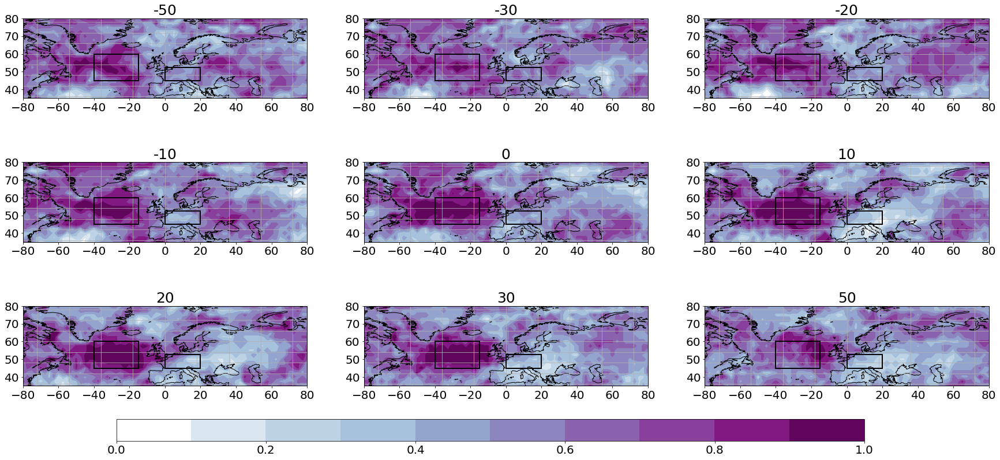

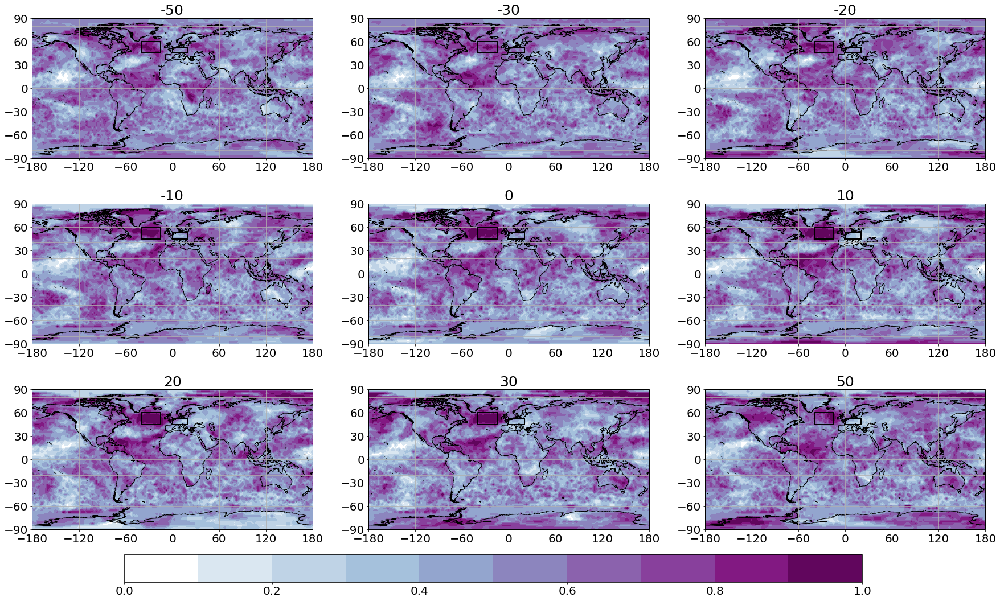

In [24]:
# Set general font size
plt.rcParams['font.size'] = '20'


files=['ERA5_SST_T2M_cold_composite_maps_Duchez_box_NA_rm_detrended_1979_2019_prob_neg.pdf','ERA5_SST_T2M_cold_composite_maps_Duchez_box_global_rm_detrended_1979_2019_prob_neg.pdf']
lag=['-60','-40','-20','-10','0','10','20','40','60']
lag_rm=['-50','-30','-20','-10','0','10','20','30','50']

figy_size= [13,17]
lon=np.linspace(0,360,145)
X, Y = np.meshgrid(lon, ds_ERA5_z.latitude)
prj = ccrs.PlateCarree()
afmhot_reversed = plt.cm.get_cmap('afmhot').reversed()

for j in range(0,2):
    fig = plt.figure(figsize=(30,figy_size[j]))
    #levels = np.linspace(-3.5,3.5,29)
    levels_prob = np.linspace(0,1.0,11)

    axs=[]
    for i in range(1,10):
        axs.append(fig.add_subplot(3,3,i, projection=prj))
    for i in range(0,9):
        #cont= axs[i].contourf(X,Y,np.c_[sst_t2m_map[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), sst_t2m_map[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels)
        cont_prob= axs[i].contourf(X,Y,np.c_[sst_t2m_map_prob_neg[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), sst_t2m_map_prob_neg[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap=BuPu_white_cm, transform=prj, levels=levels_prob)
        #axs[i].contourf(X, Y, np.c_[(sst_t2m_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val),(sst_t2m_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val)[:,0]] ,1, hatches=['','..'], alpha=0)
        #axs[i].contourf(X, Y, np.c_[(sst_t2m_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val),(sst_t2m_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val)[:,0]] ,1, hatches=['','**'], alpha=0)
        axs[i].plot(x1, y1, x2, y2,x3,y3,x4,y4,x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='-', linewidth=2)
        axs[i].set_title(lag_rm[i], size=25)

    for ax in axs:
        ax.coastlines('50m')
        #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        #ax.text(0.5, -0.22, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        ax.gridlines()
        if j==0:
            ax.set_extent([-80, 80, 35, 80], prj)
            ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
            ax.set_yticks([40, 50, 60, 70,80],crs=prj)
        if j==1: 
            ax.set_extent([-180, 180, -90, 90], prj)
            ax.set_xticks([-180, -120, -60,0, 60, 120, 180],crs=prj)
            ax.set_yticks([-90, -60, -30, 0, 30, 60, 90],crs=prj)

    cb_ax = fig.add_axes([0.2, 0.06, 0.6, 0.04])
    cb = fig.colorbar(cont_prob, cax=cb_ax, orientation='horizontal')
    cb.ax.tick_params(labelsize=20)
#    cb.set_label(label='%', size='large', weight='bold')
    plt.savefig(files[j])

### SST/T2M anomalies based on WARM SST composites

/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should b

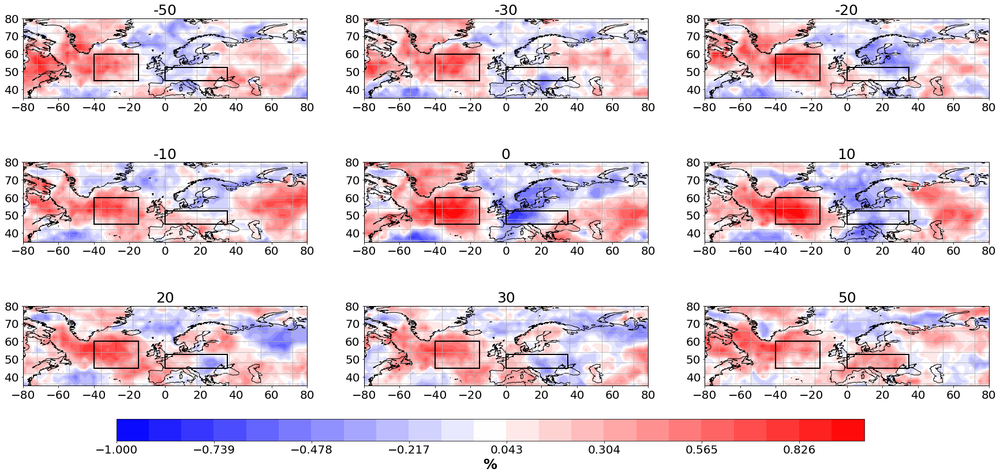

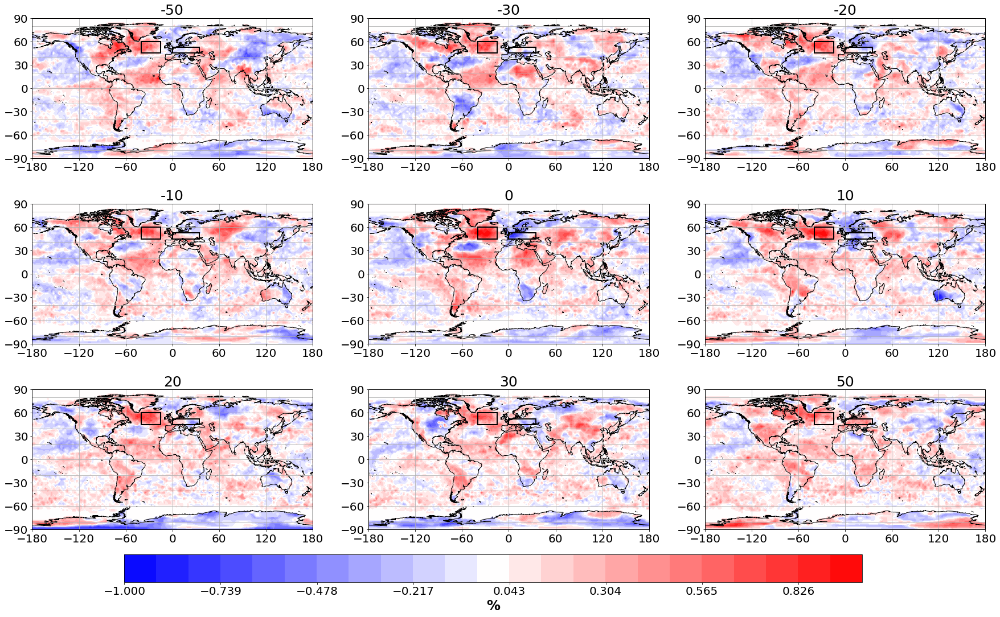

In [24]:
files=['ERA5_SST_T2M_warm_composite_maps_Duchez_box_NA_rm_detrended_1950_1979_prob.pdf','ERA5_SST_T2M_warm_composite_maps_Duchez_box_global_rm_detrended_1950_1979_prob.pdf']
figy_size= [13,17]

for j in range(0,2):
    fig = plt.figure(figsize=(30,figy_size[j]))
    #levels = np.linspace(-3.5,3.5,29)
    levels_prob = np.linspace(-1.0,1.0,24)
    axs=[]
    for i in range(1,10):
        axs.append(fig.add_subplot(3,3,i, projection=prj))
    for i in range(0,9):
        #cont= axs[i].contourf(X,Y,np.c_[sst_t2m_map[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), sst_t2m_map[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels)
        cont_prob= axs[i].contourf(X,Y,np.c_[sst_t2m_map_prob[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), sst_t2m_map_prob[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels_prob)
        #axs[i].contourf(X, Y, np.c_[(sst_t2m_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val),(sst_t2m_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val)[:,0]] ,1, hatches=['','..'], alpha=0)
        #axs[i].contourf(X, Y, np.c_[(sst_t2m_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val),(sst_t2m_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val)[:,0]] ,1, hatches=['','**'], alpha=0)       
        axs[i].plot(x1, y1, x2, y2,x3,y3,x4,y4,x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='-', linewidth=2)
        axs[i].set_title(lag_rm[i], size=25)

    for ax in axs:
        ax.coastlines('50m')
        #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        #ax.text(0.5, -0.22, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        ax.gridlines()
        if j==0:
            ax.set_extent([-80, 80, 35, 80], prj)
            ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
            ax.set_yticks([40, 50, 60, 70,80],crs=prj)
        if j==1: 
            ax.set_extent([-180, 180, -90, 90], prj)
            ax.set_xticks([-180, -120, -60,0, 60, 120, 180],crs=prj)
            ax.set_yticks([-90, -60, -30, 0, 30, 60, 90],crs=prj)

    cb_ax = fig.add_axes([0.2, 0.06, 0.6, 0.04])
    cb = fig.colorbar(cont_prob, cax=cb_ax, orientation='horizontal')
    cb.ax.tick_params(labelsize=20)
    cb.set_label(label='%', size='large', weight='bold')
    plt.savefig(files[j])

### Z300 anomalies based on COLD SST composites

/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should b

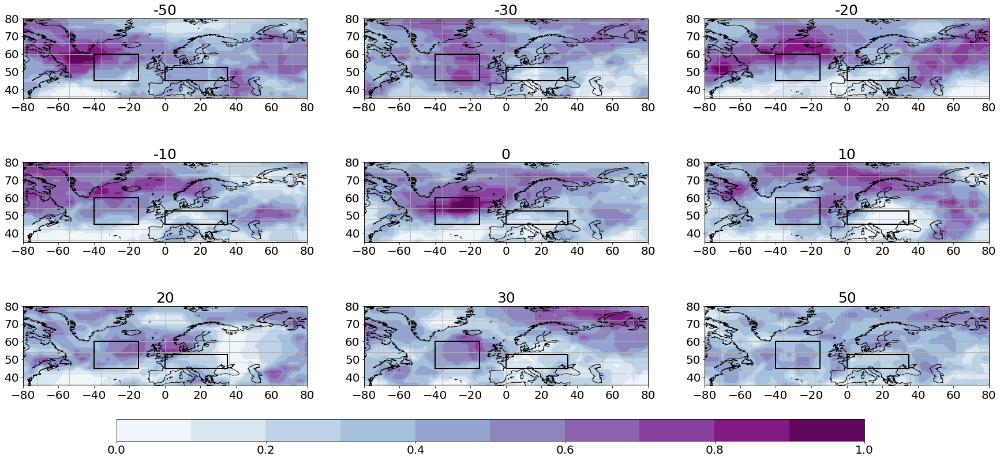

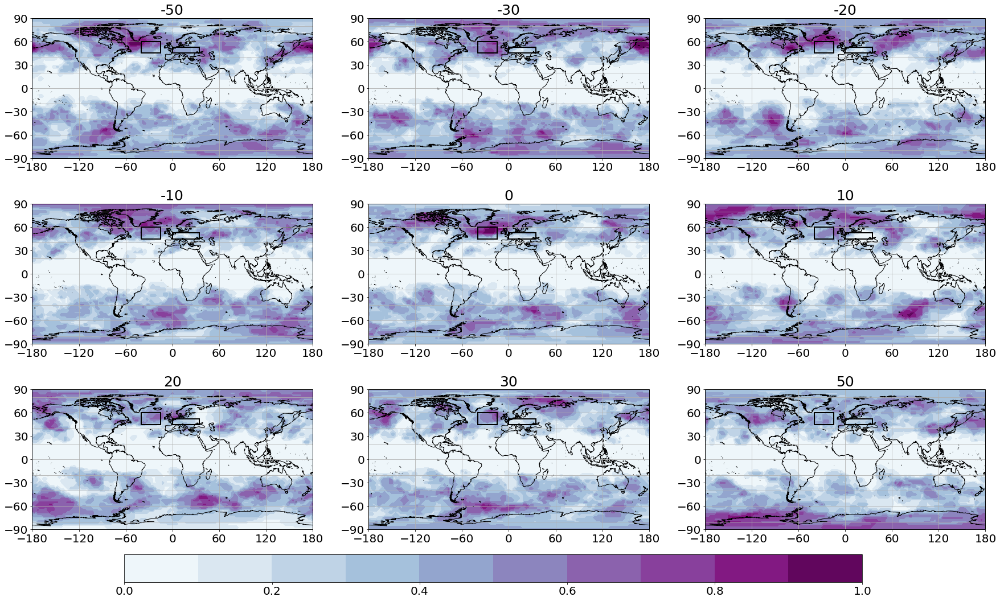

In [264]:
files=['ERA5_Z300_cold_composite_maps_Duchez_box_NA_rm_detrended_1979_2019_prob_neg.pdf','ERA5_Z300_cold_composite_maps_Duchez_box_global_rm_detrended_1979_2019_prob_neg.pdf']
levels = np.linspace(-180,180,17)
figy_size= [13,17]
levels_prob = np.linspace(0,1.0,11)

for j in range(0,2):
    fig = plt.figure(figsize=(30,figy_size[j]))
    axs=[]
    for i in range(1,10):
        axs.append(fig.add_subplot(3,3,i, projection=prj))
    for i in range(0,9):
        #cont= axs[i].contourf(X,Y,np.c_[z_map[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), z_map[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels)
        cont_prob= axs[i].contourf(X,Y,np.c_[z_map_prob_neg[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), z_map_prob_neg[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='BuPu', transform=prj, levels=levels_prob)
        #axs[i].contourf(X, Y, np.c_[(z_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val),(z_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val)[:,0]] ,1, hatches=['','..'], alpha=0)
        #axs[i].contourf(X, Y, np.c_[(z_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val),(z_map_welch[0].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val)[:,0]] ,1, hatches=['','**'], alpha=0)
        axs[i].plot(x1, y1, x2, y2,x3,y3,x4,y4,x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='-', linewidth=2)
        axs[i].set_title(lag_rm[i], size=25)

    for ax in axs:
        ax.coastlines('50m')
        #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        #ax.text(0.5, -0.3, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        ax.gridlines()
        if j==0:
            ax.set_extent([-80, 80, 35, 80], prj)
            ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
            ax.set_yticks([40, 50, 60, 70,80],crs=prj)
        if j==1: 
            ax.set_extent([-180, 180, -90, 90], prj)
            ax.set_xticks([-180, -120, -60,0, 60, 120, 180],crs=prj)
            ax.set_yticks([-90, -60, -30, 0, 30, 60, 90],crs=prj)

    cb_ax = fig.add_axes([0.2, 0.06, 0.6, 0.04])
    cb = fig.colorbar(cont_prob, cax=cb_ax, orientation='horizontal')
    cb.ax.tick_params(labelsize=20)
    #cb.set_label(label='%', size='large', weight='bold')
    plt.savefig(files[j])

### Z300 anomalies based on WARM SST composites

/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should b

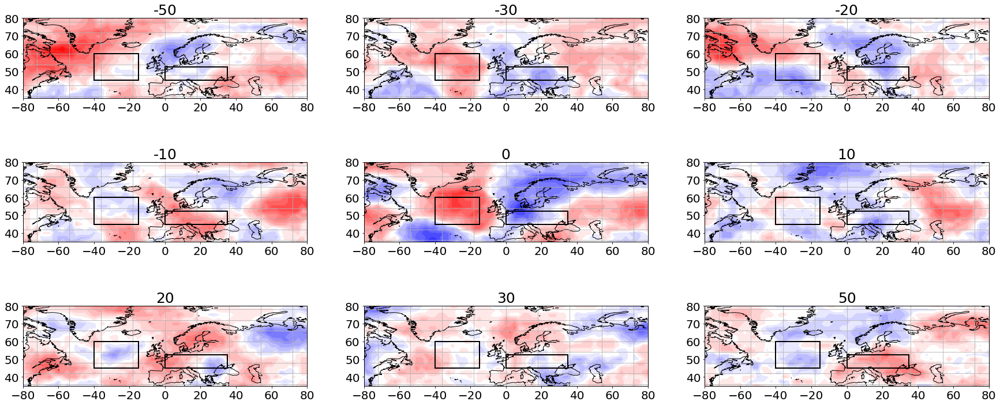

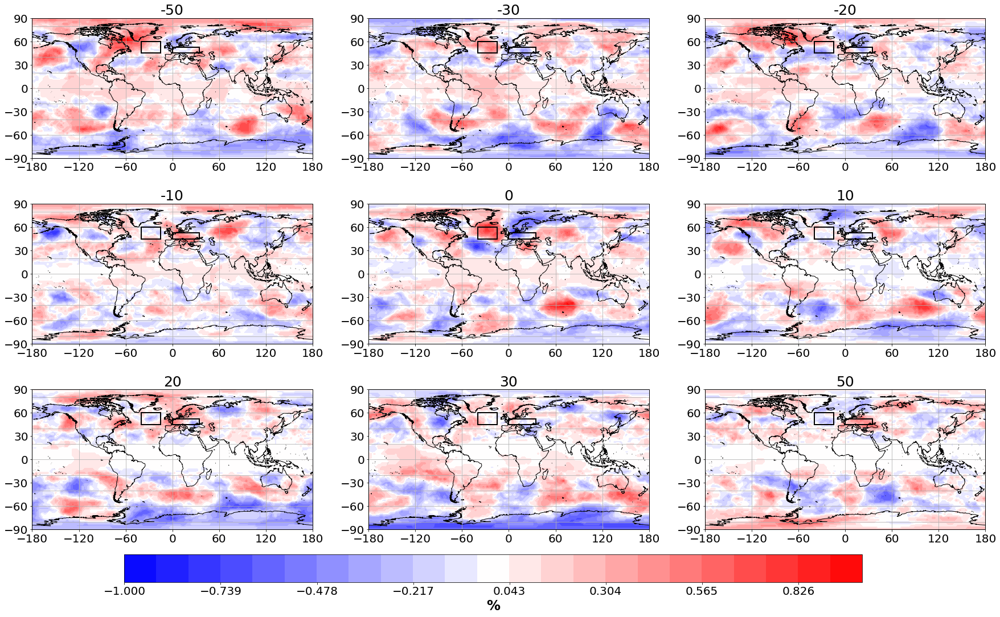

In [26]:
files=['ERA5_Z300_warm_composite_maps_Duchez_box_NA_rm_detrended_1979_2019_prob.pdf', 'ERA5_Z300_warm_composite_maps_Duchez_box_global_rm_detrended_1979_2019_prob.pdf']
levels = np.linspace(-180,180,17)
figy_size= [13,17]

for j in range(0,2):
    fig = plt.figure(figsize=(30,figy_size[j]))
    axs=[]
    for i in range(1,10):
        axs.append(fig.add_subplot(3,3,i, projection=prj))
    for i in range(0,9):
        #cont= axs[i].contourf(X,Y,np.c_[z_map[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), z_map[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels)
        cont_prob= axs[i].contourf(X,Y,np.c_[z_map_prob[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze(), z_map_prob[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze()[:,0]], cmap='bwr', transform=prj, levels=levels_prob)
        #axs[i].contourf(X, Y, np.c_[(z_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val),(z_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < upp_p_val)[:,0]] ,1, hatches=['','..'], alpha=0)
        #axs[i].contourf(X, Y, np.c_[(z_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val),(z_map_welch[1].sel(lead_lag=slice(int(lag_rm[i]),int(lag_rm[i]))).squeeze() < low_p_val)[:,0]] ,1, hatches=['','**'], alpha=0)
        axs[i].plot(x1, y1, x2, y2,x3,y3,x4,y4,x1_E, y1_E, x2_E, y2_E,x3_E,y3_E,x4_E,y4_E, color='black', linestyle='-', linewidth=2)
        axs[i].set_title(lag_rm[i], size=25)

    for ax in axs:
        ax.coastlines('50m')
        #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        #ax.text(0.5, -0.3, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
        ax.gridlines()
        if j==0:
            ax.set_extent([-80, 80, 35, 80], prj)
            ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
            ax.set_yticks([40, 50, 60, 70,80],crs=prj)
        if j==1: 
            ax.set_extent([-180, 180, -90, 90], prj)
            ax.set_xticks([-180, -120, -60,0, 60, 120, 180],crs=prj)
            ax.set_yticks([-90, -60, -30, 0, 30, 60, 90],crs=prj)

cb_ax = fig.add_axes([0.2, 0.06, 0.6, 0.04])
cb = fig.colorbar(cont_prob, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='%', size='large', weight='bold')
plt.savefig(files[j])

### Box averages with composite time mean

114


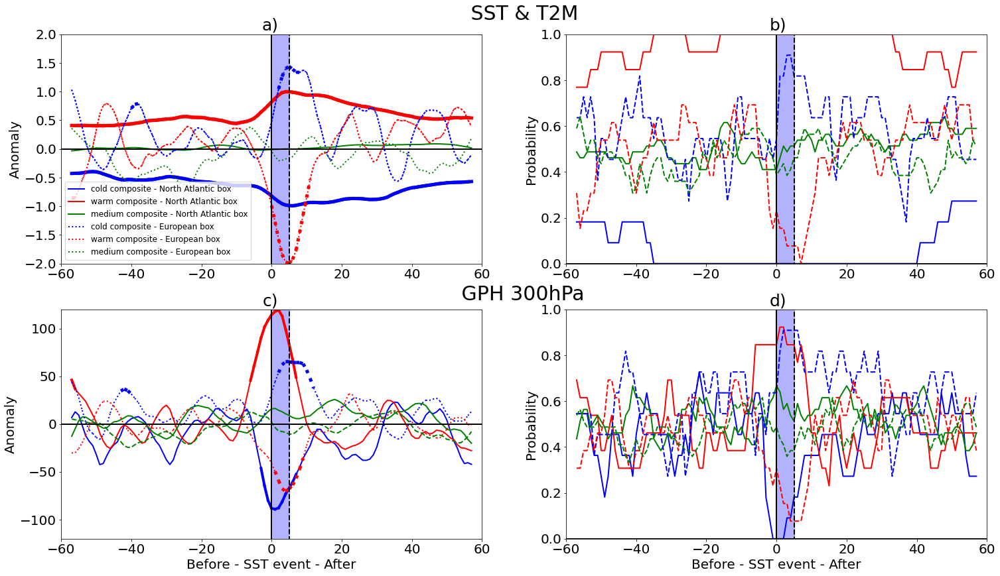

In [92]:
# Set general font size
plt.rcParams['font.size'] = '20'
#### SST und T2M
#files=['ERA5_SST_T2M_composite_lead_lag_Duchez_box_SST_first_val_rm_detrended_1979_2019.pdf' ]
label= ['cold composite - North Atlantic box','warm composite - North Atlantic box','medium composite - North Atlantic box','cold composite - European box','warm composite - European box','medium composite - European box', ]
color=['blue','red','green','blue','red','green']
lag=np.linspace(-60,60,121)
lag_rm=np.linspace(-57,57,115)
print(len(lag_rm)-1)
fig = plt.figure(figsize=(25,14))
axs=[]
for i in range(1,5):
        axs.append(fig.add_subplot(2,2,i))
for i in range(0,6):
        if i<3:
            axs[0].plot(lag_rm,sst_t2m_Atl_line[i], lw=2,label=label[i], color=color[i])
            if i<2:
                for j in range(len(lag_rm)-1):
                        if i==0 and sst_t2m_Atl_line_welch[0][j]<0.05:
                            axs[0].plot([lag_rm[j], lag_rm[j+1]],[sst_t2m_Atl_line[i][j],sst_t2m_Atl_line[i][j+1]], lw=5, color=color[i])
                        elif i==0 and sst_t2m_Atl_line_welch[0][j]>0.05:
                            axs[0].plot(lag_rm,sst_t2m_Atl_line[i], lw=2,label=label[i], color=color[i])
                        if i==1 and sst_t2m_Atl_line_welch[1][j]<0.05:
                            axs[0].plot([lag_rm[j], lag_rm[j+1]],[sst_t2m_Atl_line[i][j],sst_t2m_Atl_line[i][j+1]], lw=5, color=color[i])
        else:
            axs[0].plot(lag_rm,sst_t2m_Euro_line[i-3], lw=2,label=label[i], color=color[i], ls='dotted')
            if i>2 and i<5:
                for j in range(len(lag_rm)-1):
                        if i==3 and sst_t2m_Euro_line_welch[0][j]<0.05:
                            axs[0].plot([lag_rm[j], lag_rm[j+1]],[sst_t2m_Euro_line[i-3][j],sst_t2m_Euro_line[i-3][j+1]], lw=5, color=color[i], ls='dotted')
                        elif i==3 and sst_t2m_Euro_line_welch[0][j]>0.05:
                            axs[0].plot([lag_rm[j], lag_rm[j+1]],[sst_t2m_Euro_line[i-3][j],sst_t2m_Euro_line[i-3][j+1]], lw=2, color=color[i], ls='dotted')
                        if i==4 and sst_t2m_Euro_line_welch[1][j]<0.05:
                            axs[0].plot([lag_rm[j], lag_rm[j+1]],[sst_t2m_Euro_line[i-3][j],sst_t2m_Euro_line[i-3][j+1]], lw=5, color=color[i], ls='dotted')
                        elif i==4 and sst_t2m_Euro_line_welch[1][j]>0.05:
                            axs[0].plot([lag_rm[j], lag_rm[j+1]],[sst_t2m_Euro_line[i-3][j],sst_t2m_Euro_line[i-3][j+1]], lw=2, color=color[i], ls='dotted')

axs[0].text(-2.5,2.25,'                                 SST & T2M', fontsize=30)
axs[0].plot([-60, 60], [0, 0], color='black', lw=2)
axs[0].axvspan(0, 5, alpha=0.3, color='blue')
axs[0].plot([5,5],[-130,130], color='black', ls='--', lw=2)
axs[0].plot([0,0], [-130, 130], color='black', lw=2)
axs[0].legend(fontsize=12, loc=3)
#for ax in axs:
axs[0].set_xticks([-60,-40,-20,0,20,40,60])
axs[0].set_yticks([-2,-1.5,-1,-0.5,0,0.5,1,1.5,2])
    #ax.set_xlabel('Before - SST event - After', fontsize=20)
axs[0].set_ylabel('Anomaly', fontsize=20)
axs[0].set_xlim([-60,60])
axs[0].set_ylim([-2,2])

### SST & T2M - prob
for i in range(0,6):
        if i<3:
            axs[1].plot(lag_rm,sst_t2m_Atl_line_prob_pos[i], lw=2,label=label[i], color=color[i])
        else:
            axs[1].plot(lag_rm,sst_t2m_Euro_line_prob_pos[i-3], lw=2,label=label[i], color=color[i], ls='dashed')

axs[1].plot([-60, 60], [0, 0], color='black', lw=2)
axs[1].axvspan(0, 5, alpha=0.3, color='blue')
axs[1].plot([5,5],[-130,130], color='black', ls='--', lw=2)
axs[1].plot([0,0], [-130, 130], color='black', lw=2)
#for ax in axs:
axs[1].set_xticks([-60,-40,-20,0,20,40,60])
    #ax.set_xlabel('Before - SST event - After', fontsize=20)
axs[1].set_ylabel('Probability', fontsize=20)
axs[1].set_xlim([-60,60])
axs[1].set_ylim([0,1])
#axs[0].savefig(files[0])

#############################

#### Z300
files=['ERA5_SST_T2M_Z300_composite_lead_lag_Duchez_box_SST_first_val_rm_detrended_1979_2019_abs_prob.pdf']
label= ['cold composite - Atlantic Z300 mean','warm composite - Atlantic Z300 mean','medium composite - Atlantic Z300 mean','cold composite - European Z300 mean','warm composite - European Z300 mean','medium composite - European Z300 mean', ]

#fig = plt.figure(figsize=(30,12))
for i in range(0,6):
    if i<3:
        axs[2].plot(lag_rm,z_Atl_line[i], lw=2,label=label[i], color=color[i])
        if i<2:
                for j in range(len(lag_rm)-1):
                        if i==0 and z_Atl_line_welch[0][j]<0.05:
                            axs[2].plot([lag_rm[j], lag_rm[j+1]],[z_Atl_line[i][j],z_Atl_line[i][j+1]], lw=4, color=color[i])
                        if i==1 and z_Atl_line_welch[1][j]<0.05:
                            axs[2].plot([lag_rm[j], lag_rm[j+1]],[z_Atl_line[i][j],z_Atl_line[i][j+1]], lw=4, color=color[i])
    else:
        if i==5:
            axs[2].plot(lag_rm,z_Euro_line[i-3], lw=2,label=label[i], color=color[i], ls='dashed')
        elif i>2 and i<5:
                for j in range(len(lag_rm)-1):
                        if i==3 and z_Euro_line_welch[0][j]<0.05:
                            axs[2].plot([lag_rm[j], lag_rm[j+1]],[z_Euro_line[i-3][j],z_Euro_line[i-3][j+1]], lw=5, color=color[i], ls='dotted')
                        elif i==3 and z_Euro_line_welch[0][j]>0.05:
                            axs[2].plot([lag_rm[j], lag_rm[j+1]],[z_Euro_line[i-3][j],z_Euro_line[i-3][j+1]], lw=2, color=color[i], ls='dotted')
                        if i==4 and z_Euro_line_welch[1][j]<0.05:
                            axs[2].plot([lag_rm[j], lag_rm[j+1]],[z_Euro_line[i-3][j],z_Euro_line[i-3][j+1]], lw=5, color=color[i], ls='dotted')
                        elif i==4 and z_Euro_line_welch[1][j]>0.05:
                            axs[2].plot([lag_rm[j], lag_rm[j+1]],[z_Euro_line[i-3][j],z_Euro_line[i-3][j+1]], lw=2, color=color[i], ls='dotted')

axs[2].plot([-60, 60], [0, 0], color='black', lw=2)
axs[2].axvspan(0, 5, alpha=0.3, color='blue')
axs[2].plot([5,5],[-130,130], color='black', ls='--', lw=2)
axs[2].plot([0,0], [-130, 130], color='black', lw=2)
#for ax in axs:
axs[2].set_xticks([-60,-40,-20,0,20,40,60])
axs[2].set_yticks([-100,-50,0,50,100])
axs[2].set_xlabel('Before - SST event - After', fontsize=20)
axs[2].set_ylabel('Anomaly', fontsize=20)
axs[2].text(-1.5,130,'                               GPH 300hPa', fontsize=30)
axs[2].set_xlim([-60,60])
axs[2].set_ylim([-120,120])

#### Z300 - prob
for i in range(0,6):
    if i<3:
        axs[3].plot(lag_rm,z_Atl_line_prob_pos[i], lw=2,label=label[i], color=color[i])
    else:
        axs[3].plot(lag_rm,z_Euro_line_prob_pos[i-3], lw=2,label=label[i], color=color[i], ls='dashed')
axs[3].plot([-60, 60], [0, 0], color='black', lw=2)
axs[3].axvspan(0, 5, alpha=0.3, color='blue')
axs[3].plot([5,5],[-130,130], color='black', ls='--', lw=2)
axs[3].plot([0,0], [-130, 130], color='black', lw=2)
#for ax in axs:
axs[3].set_xticks([-60,-40,-20,0,20,40,60])
axs[3].set_xlabel('Before - SST event - After', fontsize=20)
axs[3].set_ylabel('Probability', fontsize=20)
axs[3].set_xlim([-60,60])
axs[3].set_ylim([0,1.])
plt.figtext(0.3,0.905,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.3,0.4925,"c)", ha="center", va="top", fontsize=25)
plt.figtext(0.725,0.905,"b)", ha="center", va="top", fontsize=25)
plt.figtext(0.725,0.4925,"d)", ha="center", va="top", fontsize=25)
plt.savefig(files[0])

### Box averages without composite time mean

In [28]:
#### SST und T2M
files=['ERA5_SST_T2M_composite_lead_lag_Duchez_box_SST_first_val_rm_spaghetti_Atl_detrended.pdf', 'ERA5_SST_T2M_composite_lead_lag_Duchez_box_SST_first_val_rm_spaghetti_Euro_detrended.pdf' ]
label= ['cold composite - Atlantic SST mean','warm composite - Atlantic SST mean','medium composite - Atlantic SST mean','cold composite - European T2M mean','warm composite - European T2M mean','medium composite - European T2M mean', ]
color=['blue','red','green','blue','red','green']
lag=np.linspace(-60,60,121)
lag_rm=np.linspace(-57,57,115)
sst_t2m_line_wtm = [sst_t2m_Atl_line_wtm, sst_t2m_Euro_line_wtm]
ylim= [2,5]
for j in range(0,2):
    fig = plt.figure(figsize=(30,12))
    for i in range(0,6):
            if i<3:
                plt.plot(lag_rm,sst_t2m_Atl_line[i], lw=3,label=label[i], color=color[i])
            else:
                plt.plot(lag_rm,sst_t2m_Euro_line[i-3], lw=3,label=label[i], color=color[i], ls='dashed')

    for i in range(0, len(sst_t2m_Atl_line_wtm[0].time)):
        plt.plot(lag_rm,sst_t2m_line_wtm[j][0], lw=0.5, color='blue')
    for i in range(0, len(sst_t2m_Atl_line_wtm[0].time)):
        plt.plot(lag_rm,sst_t2m_line_wtm[j][1], lw=0.5, color='red')

    plt.plot([-60, 60], [0, 0], color='black', lw=2)
    plt.axvspan(0, 5, alpha=0.3, color='blue')
    plt.plot([5,5],[-130,130], color='black', ls='--', lw=2)
    plt.plot([0,0], [-130, 130], color='black', lw=2)
    plt.legend(fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel('T2M leads - 0 - SST leads', fontsize=20)
    plt.ylabel('Temperature anomaly (°C)', fontsize=20)
    plt.title('Box averages of SST & T2M composites based on cold, medium and warm North Atlantic SSTs', fontsize=30)
    plt.xlim([-60,60])
    plt.ylim([-ylim[j],ylim[j]])
    #plt.savefig(files[j])



NameError: name 'sst_t2m_Atl_line_wtm' is not defined

* Z300

In [ ]:
files=['ERA5_Z300_composite_lead_lag_Duchez_box_SST_first_val_rm_spaghetti_Atl_detrended.pdf', 'ERA5_Z300_composite_lead_lag_Duchez_box_SST_first_val_rm_spaghetti_Euro_detrended.pdf' ]

z_line_wtm = [z_Atl_line_wtm, z_Euro_line_wtm]
ylim= [200,200]
for j in range(0,2):
    fig = plt.figure(figsize=(30,12))
    for i in range(0,6):
            if i<3:
                plt.plot(lag_rm,z_Atl_line[i], lw=3,label=label[i], color=color[i])
            else:
                plt.plot(lag_rm,z_Euro_line[i-3], lw=3,label=label[i], color=color[i], ls='dashed')

    for i in range(0, len(z_Atl_line_wtm[0].time)):
        plt.plot(lag_rm,z_line_wtm[j][0], lw=0.5, color='blue')
    for i in range(0, len(z_Atl_line_wtm[0].time)):
        plt.plot(lag_rm,z_line_wtm[j][1], lw=0.5, color='red')

    plt.plot([-60, 60], [0, 0], color='black', lw=2)
    plt.axvspan(0, 5, alpha=0.3, color='blue')
    plt.plot([5,5],[-200,200], color='black', ls='--', lw=2)
    plt.plot([0,0], [-200, 200], color='black', lw=2)
    plt.legend(fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel('GPH leads - 0 - SST leads', fontsize=20)
    plt.ylabel('GPH anomaly (gpm)', fontsize=20)
    plt.title('Box averages of Z300 composites based on cold, medium and warm North Atlantic SSTs', fontsize=30)
    plt.xlim([-60,60])
    plt.ylim([-ylim[j],ylim[j]])
    #plt.savefig(files[j])

### Plot lat vs lead/lag contourf plots

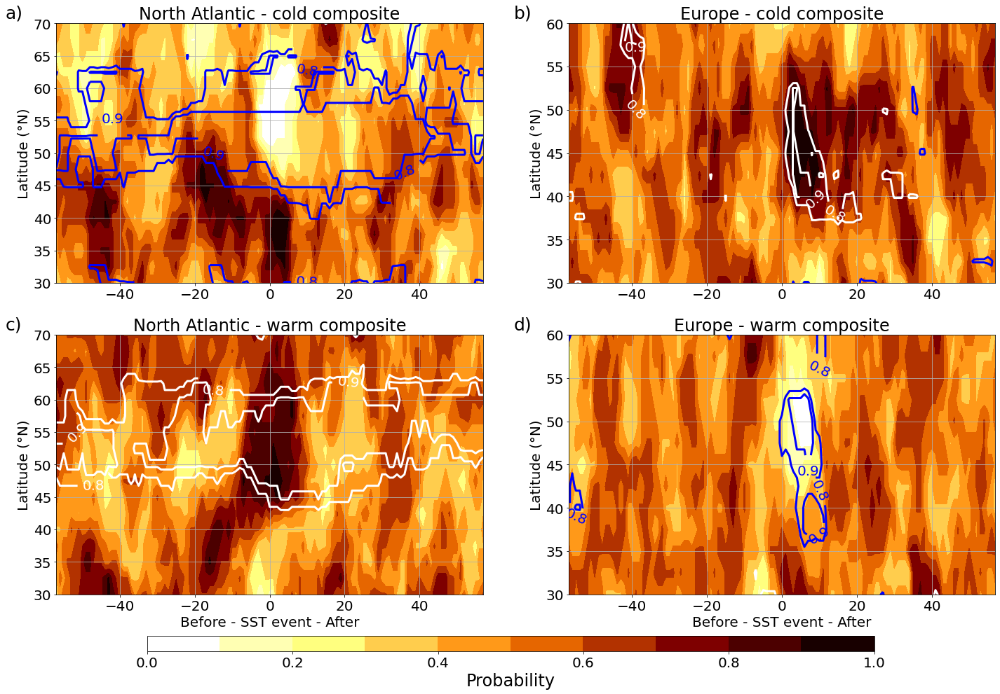

In [94]:
ds_z_lat_lead= [z_Atl_lat_lead_prob_pos[0],z_Euro_lat_lead_prob_pos[0], z_Atl_lat_lead_prob_pos[1], z_Euro_lat_lead_prob_pos[1]]
ds_sst_t2m_lat_lead_pos= [sst_t2m_Atl_lat_lead_prob_pos[0],sst_t2m_Euro_lat_lead_prob_pos[0], sst_t2m_Atl_lat_lead_prob_pos[1], sst_t2m_Euro_lat_lead_prob_pos[1]]
ds_sst_t2m_lat_lead_neg= [sst_t2m_Atl_lat_lead_prob_neg[0],sst_t2m_Euro_lat_lead_prob_neg[0], sst_t2m_Atl_lat_lead_prob_neg[1], sst_t2m_Euro_lat_lead_prob_neg[1]]

ds_z_welch_lat_lead= [z_Atl_lat_lead_welch[0],z_Euro_lat_lead_welch[0], z_Atl_lat_lead_welch[1], z_Euro_lat_lead_welch[1]]

#### Without running mean
fig = plt.figure(figsize=(24,15))
titles=['North Atlantic - cold composite','Europe - cold composite',  'North Atlantic - warm composite', 'Europe - warm composite']
levels=np.linspace(0,1.0,11)
clevels=np.linspace(0,0.6,4)
clevels_max=np.linspace(0.8,1.0,3)

axs=[]
for i in range(1,5):
    axs.append(fig.add_subplot(2,2,i))
for i in range(0,4):
    contf= axs[i].contourf(z_Atl_lat_lead[0].lead_lag, z_Atl_lat_lead[0].lat,ds_z_lat_lead[i].transpose(), cmap=afmhot_reversed_white_cm, levels=levels)
    #cont=axs[i].contour(sst_t2m_Atl_lat_lead[0].lead_lag, sst_t2m_Atl_lat_lead[0].lat, ds_sst_t2m_lat_lead[i].transpose(), colors='black', levels=clevels, linestyles='--')
    #axs[i].clabel(cont, inline=True, fmt='%1.1f', fontsize=15)
    cont=axs[i].contour(sst_t2m_Atl_lat_lead[0].lead_lag, sst_t2m_Atl_lat_lead[0].lat, ds_sst_t2m_lat_lead_pos[i].transpose(), colors='white', levels=clevels_max, linewidths=3)
    axs[i].clabel(cont, inline=True, fmt='%1.1f', fontsize=20)
    cont=axs[i].contour(sst_t2m_Atl_lat_lead[0].lead_lag, sst_t2m_Atl_lat_lead[0].lat, ds_sst_t2m_lat_lead_neg[i].transpose(), colors='blue', levels=clevels_max, linewidths=3)
    #axs[i].contourf(z_Atl_lat_lead_welch[0].lead_lag, z_Atl_lat_lead_welch[0].lat,(ds_z_welch_lat_lead[i].squeeze() < low_p_val).transpose(),1, hatches=['','**'], alpha=0)
    #axs[i].contourf(z_Atl_lat_lead_welch[0].lead_lag, z_Atl_lat_lead_welch[0].lat,(ds_z_welch_lat_lead[i].squeeze() < upp_p_val).transpose(),1, hatches=['','..'], alpha=0)
    axs[i].clabel(cont, inline=True, fmt='%1.1f', fontsize=20)
    if i>1:
        axs[i].set_xlabel('Before - SST event - After')
    axs[i].set_ylabel('Latitude (°N)')
    axs[i].set_title(titles[i])
    axs[i].set_ylim([30,70])
    axs[1].set_ylim([30,60])
    axs[3].set_ylim([30,60])
    axs[i].grid()
plt.figtext(0.09,0.905,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.4925,"c)", ha="center", va="top", fontsize=25)
plt.figtext(0.51,0.905,"b)", ha="center", va="top", fontsize=25)
plt.figtext(0.51,0.4925,"d)", ha="center", va="top", fontsize=25)

cb_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])
cb = fig.colorbar(contf, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='Probability', size='large')
plt.savefig('ERA5_Z300_SST_T2M_composite_lead_lag_lat_Duchez_box_SST_first_val_rm_detrended_1979_2019_prob_pos.pdf')

In [2]:
################# Produce function that converts from 0-360 to -180 and +180
def wrapTo180(ds,longitude):

    # Adjust lon values to make sure they are within (-180, 180)
    ds['_longitude_wrapped'] = xr.where(longitude > 180., longitude - 360., longitude)

    # reassign the new coords to as the main lon coords
    # and sort DataArray using new coordinate values
    ds = (ds.swap_dims({'lon': '_longitude_wrapped'})
          .sel(**{'_longitude_wrapped': sorted(ds._longitude_wrapped)}).drop('lon'))
    ds = ds.rename({'_longitude_wrapped': 'lon'})
    return ds
##################


### Plot lead/lag vs lon contourf plots: Z300 - PW & RWP - ANOMALIES

<xarray.DataArray (lat: 73, lon: 144)>
array([[-31.58275   , -31.58275   , -31.58275   , ..., -31.58275   ,
        -31.58275   , -31.58275   ],
       [-16.241455  , -15.722953  , -15.234669  , ..., -17.95979   ,
        -17.360046  , -16.790382  ],
       [ -2.570108  ,  -1.6667148 ,  -0.84317917, ...,  -5.714615  ,
         -4.5904603 ,  -3.539457  ],
       ...,
       [ 31.890663  ,  32.105164  ,  32.311977  , ...,  31.324663  ,
         31.50304   ,  31.68648   ],
       [ 31.071705  ,  31.114166  ,  31.141157  , ...,  30.8657    ,
         30.947418  ,  31.016468  ],
       [ 26.724424  ,  26.724424  ,  26.724424  , ...,  26.724424  ,
         26.724424  ,  26.724394  ]], dtype=float32)
Coordinates:
    lead_lag            int64 5
  * lat                 (lat) float64 90.0 87.5 85.0 82.5 ... -85.0 -87.5 -90.0
  * lon                 (lon) float64 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
    _longitude_wrapped  (lon) float64 0.0 2.5 5.0 7.5 ... -10.0 -7.5 -5.0 -2.5


/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)


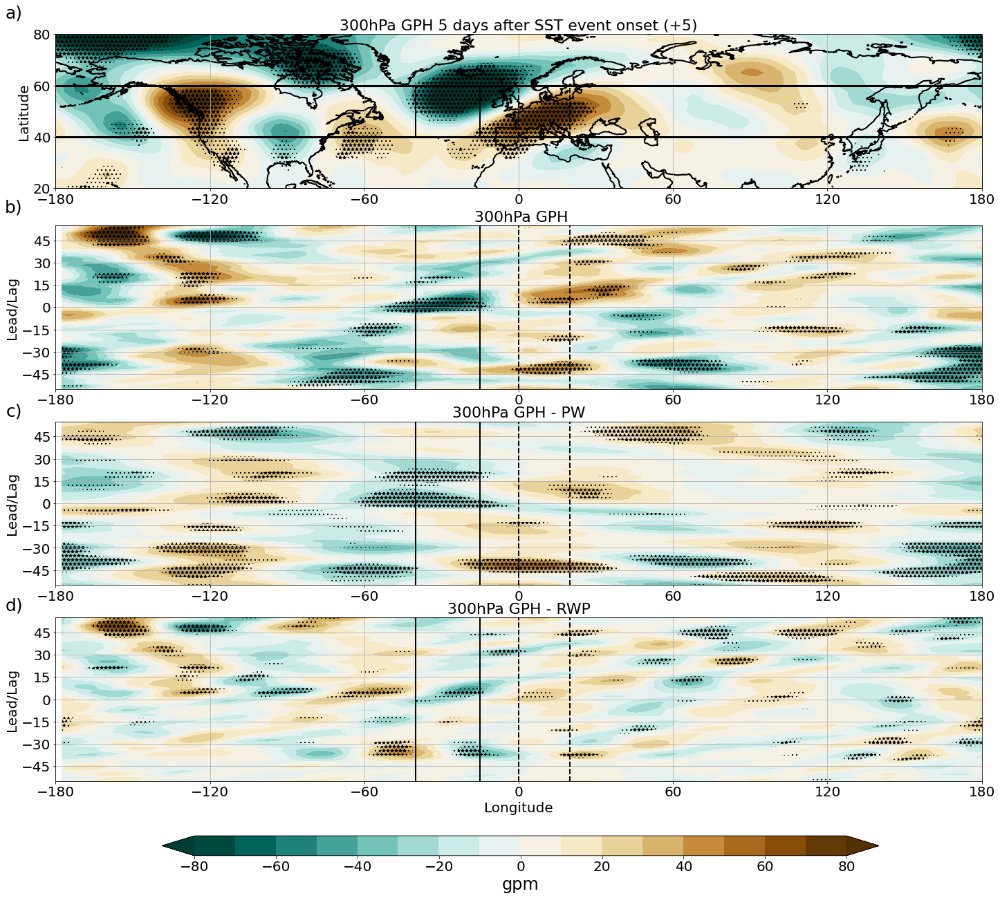

In [96]:
ds_z_rm = [z_map[0], wrapTo180(z_lon_lead[0],z_lon_lead[0].lon),wrapTo180(z_PW_lon_lead[0],z_PW_lon_lead[0].lon),wrapTo180(z_RWP_lon_lead[0],z_RWP_lon_lead[0].lon)]
ds_z_welch_rm = [z_map_welch[0], wrapTo180(z_lon_lead_welch[0],z_lon_lead_welch[0].lon),wrapTo180(z_PW_lon_lead_welch[0],z_PW_lon_lead_welch[0].lon),wrapTo180(z_RWP_lon_lead_welch[0],z_RWP_lon_lead_welch[0].lon)]

##### Plot 
fig = plt.figure(figsize=(24,20))
titles=['300hPa GPH 5 days after SST event onset (+5)',' 300hPa GPH','300hPa GPH - PW','300hPa GPH - RWP']
levels=np.linspace(-80,80,17)
axs=[]
for i in range(1,5):
    if i==1:
        axs.append(fig.add_subplot(4,1,i, projection=prj))
    else:
        axs.append(fig.add_subplot(4,1,i))
print(ds_z_rm[0].sel(lead_lag=slice(5,5)).squeeze())
for i in range(0,4):
    if i==0:
        contf= axs[i].contourf(X,Y,np.c_[ds_z_rm[i].sel(lead_lag=slice(5,5)).squeeze(), ds_z_rm[i].sel(lead_lag=slice(5,5)).squeeze()[:,0]], cmap=BrBG_cmap, transform=prj, levels=levels, extend='both')
        axs[i].contourf(X, Y,(np.c_[ds_z_welch_rm[i].sel(lead_lag=slice(5,5)).squeeze(), ds_z_welch_rm[i].sel(lead_lag=slice(5,5)).squeeze()[:,0]] < low_p_val),1, hatches=['','**'], alpha=0, transform=prj)
        axs[i].contourf(X, Y,(np.c_[ds_z_welch_rm[i].sel(lead_lag=slice(5,5)).squeeze(), ds_z_welch_rm[i].sel(lead_lag=slice(5,5)).squeeze()[:,0]] < upp_p_val),1, hatches=['','..'], alpha=0, transform=prj)
        axs[i].plot([-40,-40],[40,60], color='black', ls='-', lw=2)
        axs[i].plot([-15,-15],[40,60], color='black', ls='-', lw=2)
        axs[i].plot([0,0],[40,60], color='black', ls='--', lw=2)
        axs[i].plot([20,20],[40,60], color='black', ls='--', lw=2)
        axs[i].plot([-180,180],[60,60], color='black', ls='-', lw=3)
        axs[i].plot([-180,180],[40,40], color='black', ls='-', lw=3)
        axs[i].set_ylabel('Latitude')
        axs[i].set_yticks([20,40, 60,80], prj)
    else:
        contf= axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,ds_z_rm[i], cmap=BrBG_cmap, levels=levels, extend='both')
        axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,(ds_z_welch_rm[i] < low_p_val),1, hatches=['','**'], alpha=0)
        axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,(ds_z_welch_rm[i] < upp_p_val),1, hatches=['','..'], alpha=0)
        #axs[-2].set_xlabel('Longitude')
        axs[i].plot([-40,-40],[-60,60], color='black', ls='-', lw=2)
        axs[i].plot([-15,-15],[-60,60], color='black', ls='-', lw=2)
        axs[i].plot([0,0],[-60,60], color='black', ls='--', lw=2)
        axs[i].plot([20,20],[-60,60], color='black', ls='--', lw=2)
        axs[i].set_ylabel('Lead/Lag')
        axs[i].set_yticks([-45,-30,-15,0,15,30,45])
    axs[i].set_title(titles[i], fontsize=22)
    axs[i].grid()
    axs[i].set_ylim([-55,55])
    axs[i].set_xticks([-180, -120, -60, 0, 60, 120, 180])
    axs[-1].set_xlabel('Longitude')
        
axs[0].coastlines('50m', lw=2)
axs[0].set_extent([-180, 180, 20, 80], prj)

    
plt.figtext(0.09,0.905,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.71,"b)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.505,"c)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.31,"d)", ha="center", va="top", fontsize=25)
#plt.figtext(0.51,0.64,"d)", ha="center", va="top", fontsize=25)
#plt.figtext(0.51,0.375,"f)", ha="center", va="top", fontsize=25)

cb_ax = fig.add_axes([0.214, 0.05, 0.6, 0.02])
cb = fig.colorbar(contf, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='gpm', size='large')
plt.savefig('ERA5_Z300_SST_T2M_composite_lead_lag_lat_Hovmoller_rm_detrended_1979_2019_Map_PW_RWP.pdf')


### Plot lead/lag vs lon contourf plots: Z300 - PW & RWP - ANOMALIES for COLD COMPOSITE ONLY

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: linewidths is ignored by contourf


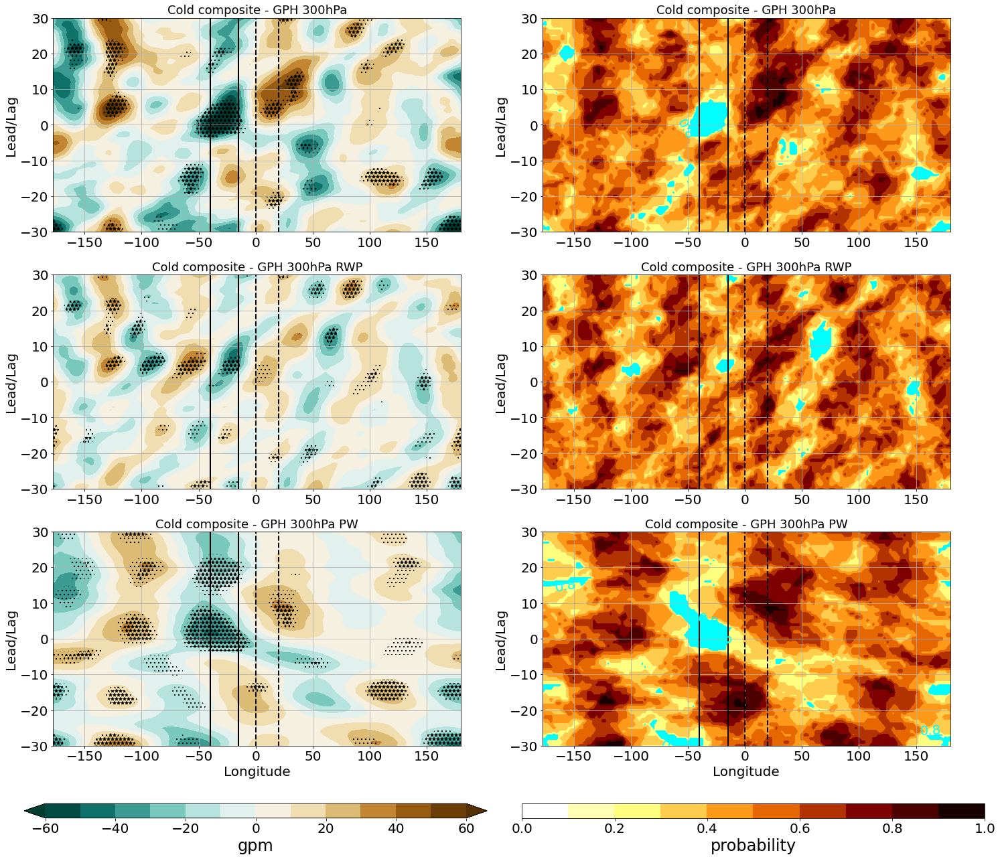

In [101]:
ds_z_rm_anom = [wrapTo180(z_lon_lead[0],z_lon_lead[0].lon),wrapTo180(z_RWP_lon_lead[0],z_RWP_lon_lead[0].lon),wrapTo180(z_PW_lon_lead[0],z_PW_lon_lead[0].lon)]
ds_z_rm_prob = [wrapTo180(z_lon_lead_prob_pos[0],z_lon_lead_prob_pos[0].lon),wrapTo180(z_lon_lead_prob_neg[0],z_lon_lead_prob_neg[0].lon), wrapTo180(z_RWP_lon_lead_prob_pos[0],z_RWP_lon_lead_prob_pos[0].lon),wrapTo180(z_RWP_lon_lead_prob_neg[0],z_RWP_lon_lead_prob_neg[0].lon), wrapTo180(z_PW_lon_lead_prob_pos[0],z_PW_lon_lead_prob_pos[0].lon), wrapTo180(z_PW_lon_lead_prob_neg[0],z_PW_lon_lead_prob_neg[0].lon)]
ds_z_welch_rm = [wrapTo180(z_lon_lead_welch[0],z_lon_lead_welch[0].lon),wrapTo180(z_RWP_lon_lead_welch[0],z_RWP_lon_lead_welch[0].lon),wrapTo180(z_PW_lon_lead_welch[0],z_PW_lon_lead_welch[0].lon)]

##### Plot 
fig = plt.figure(figsize=(24,20))
axs=[]
for i in range(1,7):
    axs.append(fig.add_subplot(3,2,i))
#axs[1].set_visible(False)
#axs[0].set_position([0.33,0.705,0.278,0.303])        
titles=['Cold composite - GPH 300hPa','Cold composite - GPH 300hPa','Cold composite - GPH 300hPa RWP','Cold composite - GPH 300hPa RWP','Cold composite - GPH 300hPa PW','Cold composite - GPH 300hPa PW']
levels=np.linspace(-60,60,13)

j=0
for i in range(0,3):
    contf_anom= axs[j].contourf(ds_z_rm_anom[i].lon, ds_z_rm_anom[i].lead_lag,ds_z_rm_anom[i], cmap=BrBG_cmap, levels=levels, extend='both')
    axs[j].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,(ds_z_welch_rm[i] < low_p_val),1, hatches=['','**'], alpha=0)
    axs[j].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,(ds_z_welch_rm[i] < upp_p_val),1, hatches=['','..'], alpha=0)
    j=j+2
levels=np.linspace(0,1,11)

j=1
for i in range(0,3):
    contf_prob= axs[j].contourf(ds_z_rm_prob[i].lon, ds_z_rm_prob[i].lead_lag,ds_z_rm_prob[j-1], cmap=afmhot_reversed_white_cm, levels=levels)
    cont= axs[j].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,ds_z_rm_prob[j], colors='cyan', levels=clevels_max, linewidths=3)
    axs[j].clabel(cont, inline=True, fmt='%1.1f', fontsize=20)
    j=j+2
    
axs[-2].set_xlabel('Longitude')
axs[-1].set_xlabel('Longitude')
for i in range(0,6):
    axs[i].plot([-40,-40],[-60,60], color='black', ls='-', lw=2)
    axs[i].plot([-15,-15],[-60,60], color='black', ls='-', lw=2)
    axs[i].plot([0,0],[-60,60], color='black', ls='--', lw=2)
    axs[i].plot([20,20],[-60,60], color='black', ls='--', lw=2)
    axs[i].set_ylabel('Lead/Lag')
    axs[i].set_title(titles[i], fontsize=18)
    axs[i].grid()
    axs[i].set_ylim([-30,30])

cb_ax = fig.add_axes([0.1, 0.05, 0.4, 0.015])
cb = fig.colorbar(contf_anom, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='gpm', size='large')

cb_ax = fig.add_axes([0.53, 0.05, 0.4, 0.015])
cb = fig.colorbar(contf_prob, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='probability', size='large')
plt.savefig('ERA5_cold_composite_lead_lag_lat_Hovmoller_rm_detrended_1979_2019_PW_RWP_anom_prob.pdf')


### Plot lead/lag vs lon contourf plots: Z300 - PW & RWP - PROBABILITIES

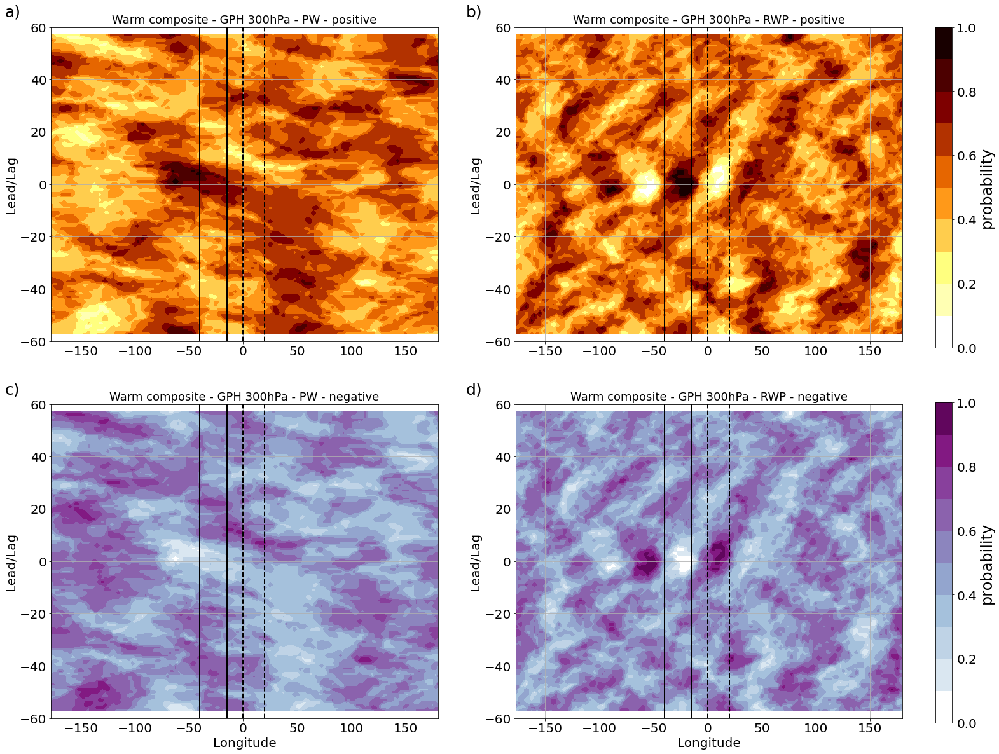

In [143]:
ds_z_prob_RWP = [wrapTo180(z_RWP_lon_lead_prob_pos[0],z_RWP_lon_lead_prob_pos[0].lon), wrapTo180(z_RWP_lon_lead_prob_pos[1],z_RWP_lon_lead_prob_pos[1].lon),wrapTo180(z_RWP_lon_lead_prob_neg[0],z_RWP_lon_lead_prob_neg[0].lon), wrapTo180(z_RWP_lon_lead_prob_neg[1],z_RWP_lon_lead_prob_neg[1].lon)]
ds_z_prob_PW = [wrapTo180(z_PW_lon_lead_prob_pos[0],z_PW_lon_lead_prob_pos[0].lon), wrapTo180(z_PW_lon_lead_prob_pos[1],z_PW_lon_lead_prob_pos[1].lon),wrapTo180(z_PW_lon_lead_prob_neg[0],z_PW_lon_lead_prob_neg[0].lon), wrapTo180(z_PW_lon_lead_prob_neg[1],z_PW_lon_lead_prob_neg[1].lon)]
ds_z_prob_comb_cold = [wrapTo180(z_PW_lon_lead_prob_pos[1],z_PW_lon_lead_prob_pos[1].lon),wrapTo180(z_RWP_lon_lead_prob_pos[1],z_RWP_lon_lead_prob_pos[1].lon),wrapTo180(z_PW_lon_lead_prob_neg[1],z_PW_lon_lead_prob_neg[1].lon),wrapTo180(z_RWP_lon_lead_prob_neg[1],z_RWP_lon_lead_prob_neg[1].lon)]
#ds_z_welch_rm = [wrapTo180(z_lon_lead_welch[0],z_lon_lead_welch[0].lon), wrapTo180(z_lon_lead_welch[1],z_lon_lead_welch[1].lon),wrapTo180(z_RWP_lon_lead_welch[0],z_RWP_lon_lead_welch[0].lon), wrapTo180(z_RWP_lon_lead_welch[1],z_RWP_lon_lead_welch[1].lon),wrapTo180(z_PW_lon_lead_welch[0],z_PW_lon_lead_welch[0].lon), wrapTo180(z_PW_lon_lead_welch[1],z_PW_lon_lead_welch[1].lon)]

##### Plot 
fig = plt.figure(figsize=(24,20))
titles=['Warm composite - GPH 300hPa - PW - positive','Warm composite - GPH 300hPa - RWP - positive','Warm composite - GPH 300hPa - PW - negative','Warm composite - GPH 300hPa - RWP - negative']
levels=np.linspace(0,1,11)
axs=[]
for i in range(1,5):
    axs.append(fig.add_subplot(2,2,i))
for i in range(0,4):
    if i<2:
        contf= axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,ds_z_prob_comb_cold[i], cmap=afmhot_reversed_white_cm, levels=levels)
        #cont= axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,ds_z_prob_RWP[i], colors='magenta', levels=clevels_max, linewidths=3)
        #axs[i].clabel(cont, inline=True, fmt='%1.1f', fontsize=20)
    else:
        contf= axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,ds_z_prob_comb_cold[i], cmap=BuPu_white_cm, levels=levels)
    #    cont= axs[i].contourf(ds_z_rm[i].lon, ds_z_rm[i].lead_lag,ds_z_prob_RWP[i], colors='cyan', levels=clevels_max, linewidths=3)
     #   axs[i].clabel(cont, inline=True, fmt='%1.1f', fontsize=20)
        
    axs[-2].set_xlabel('Longitude')
    axs[-1].set_xlabel('Longitude')
    axs[i].plot([-40,-40],[-60,60], color='black', ls='-', lw=2)
    axs[i].plot([-15,-15],[-60,60], color='black', ls='-', lw=2)
    axs[i].plot([0,0],[-60,60], color='black', ls='--', lw=2)
    axs[i].plot([20,20],[-60,60], color='black', ls='--', lw=2)
    axs[i].set_ylabel('Lead/Lag')
    axs[i].set_title(titles[i], fontsize=18)
    axs[i].grid()
    axs[i].set_ylim([-60,60])
    if i==1:
        cb_ax = fig.add_axes([0.93, 0.53, 0.015, 0.35])
        cb = fig.colorbar(contf, cax=cb_ax, orientation='vertical')
        cb.ax.tick_params(labelsize=20)
        cb.set_label(label='probability', size='large')
    elif i==3:
        cb_ax = fig.add_axes([0.93, 0.12, 0.015, 0.35])
        cb = fig.colorbar(contf, cax=cb_ax, orientation='vertical')
        cb.ax.tick_params(labelsize=20)
        cb.set_label(label='probability', size='large')
    
plt.figtext(0.09,0.905,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.4925,"c)", ha="center", va="top", fontsize=25)
plt.figtext(0.51,0.905,"b)", ha="center", va="top", fontsize=25)
plt.figtext(0.51,0.4925,"d)", ha="center", va="top", fontsize=25)

plt.savefig('ERA5_Z300_SST_T2M_warm_composite_lead_lag_lat_Hovmoller_rm_detrended_1979_2019_PW_RWP_prob.pdf')


### Plot lead/lag vs lon contourf plots: SST&T2M

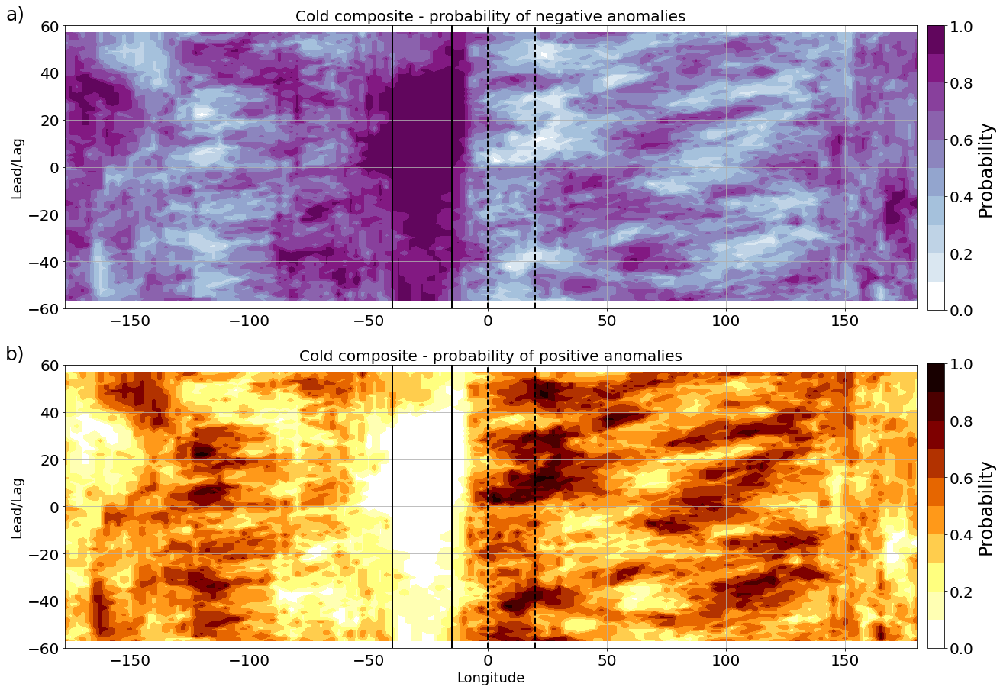

In [99]:
ds_sst_t2m_rm = [wrapTo180(sst_t2m_lon_lead_prob_neg[0],sst_t2m_lon_lead_prob_neg[0].lon), wrapTo180(sst_t2m_lon_lead_prob_pos[0],sst_t2m_lon_lead_prob_pos[0].lon)]
ds_sst_t2m_welch_rm = [wrapTo180(sst_t2m_lon_lead_welch[0],sst_t2m_lon_lead_welch[0].lon), wrapTo180(sst_t2m_lon_lead_welch[1], sst_t2m_lon_lead_welch[1].lon)]
#ds_shf_rm = [wrapTo180(shf_lon_lead[0],shf_lon_lead[0].lon), wrapTo180(shf_lon_lead[1],shf_lon_lead[1].lon)]

##### Plot 
fig = plt.figure(figsize=(20,15))
titles=['Cold composite - probability of negative anomalies','Cold composite - probability of positive anomalies']
cmap=[BuPu_white_cm, afmhot_reversed_white_cm]
y_len=[0.535,0.125]
levels=np.linspace(0,1,11)
axs=[]
for i in range(1,3):
    axs.append(fig.add_subplot(2,1,i))

for i in range(0,2):
    contf= axs[i].contourf(ds_sst_t2m_rm[i].lon, ds_sst_t2m_rm[i].lead_lag,ds_sst_t2m_rm[i], cmap=cmap[i], levels=levels)
    #cont= axs[i].contour(ds_shf_rm[i].lon, ds_shf_rm[i].lead_lag,ds_shf_rm[i], colors='black')
    #axs[i].contourf(ds_sst_t2m_rm[i].lon, ds_sst_t2m_rm[i].lead_lag,(ds_sst_t2m_welch_rm[i] < low_p_val),1, hatches=['','**'], alpha=0)
    #axs[i].contourf(ds_sst_t2m_rm[i].lon, ds_sst_t2m_rm[i].lead_lag,(ds_sst_t2m_welch_rm[i] < upp_p_val),1, hatches=['','..'], alpha=0)
    #axs[i].clabel(cont, inline=True, fmt='%1.0f', fontsize=12)
    if i==1:
        axs[i].set_xlabel('Longitude', fontsize=18)
    axs[i].plot([-40,-40],[-60,60], color='black', ls='-', lw=2)
    axs[i].plot([-15,-15],[-60,60], color='black', ls='-', lw=2)
    axs[i].plot([0,0],[-60,60], color='black', ls='--', lw=2)
    axs[i].plot([20,20],[-60,60], color='black', ls='--', lw=2)
    axs[i].set_ylabel('Lead/Lag', fontsize=18)
    axs[i].set_ylim([-60,60])
    axs[i].set_title(titles[i], fontsize=20)
    axs[i].grid()
    cb_ax = fig.add_axes([0.91, y_len[i], 0.015, 0.345])
    cb = plt.colorbar(contf, cax=cb_ax)
    cb.set_label(label='Probability', size='large')
    
plt.figtext(0.08,0.905,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.08,0.4925,"b)", ha="center", va="top", fontsize=25)

#cb_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])
#cb = fig.colorbar(contf, cax=cb_ax, orientation='horizontal')
#cb.ax.tick_params(labelsize=20)
#cb.set_label(label='Probability', size='large', weight='bold')
plt.savefig('ERA5_SST_T2M_cold_composite_lead_lag_lat_Hovmoller_rm_detrended_1979_2019_prob_neg_pos.pdf')

## All parameters together on maps with -5,0,+5 days: absolute values

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


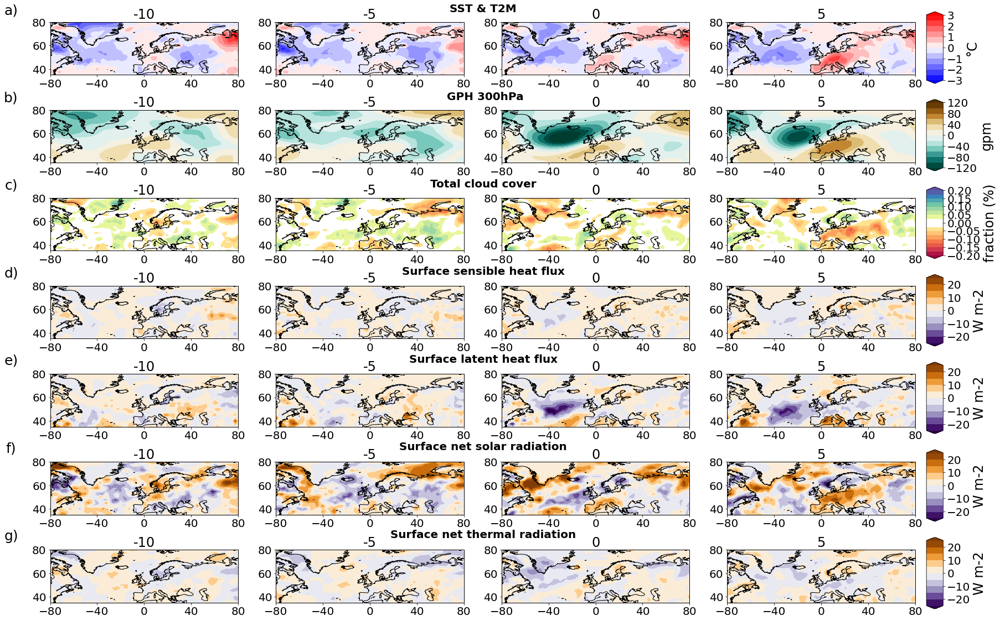

In [23]:
# Make maps before, during and after SST event for different variables:
triple_lag = [-10,-5,0,5]
fig = plt.figure(figsize=(28,20))
axs=[]
for i in range(1,29):
        axs.append(fig.add_subplot(7,4,i, projection=prj))
var_map_set = [sst_t2m_map, z_map, tcc_map,shf_map, lhf_map, snsr_map, sntr_map]
#welch_map_set=[sst_t2m_map_welch, z_map_welch, shf_map_welch,  lhf_map_welch, tcc_map_welch]
var_lag_set = ['-10','-5','0','5']
Unit=['°C','gpm','fraction (%)','W m-2','W m-2','W m-2','W m-2']
PuOr_cmap = plt.cm.get_cmap('PuOr').reversed()
BrBG_cmap = plt.cm.get_cmap('BrBG').reversed()
spectral = plt.cm.get_cmap('Spectral', 256)
spectral_white = spectral(np.linspace(0, 1, 256))
white = np.array([1., 1., 1., 1.])
spectral_white[114:142, :] = white
spectral_white_cm= ListedColormap(spectral_white)
#spectral_white= ListedColormap(["darkred", "red","darkorange", "orange","gold", "white","lightcyan","cyan", "darkcyan","blue","darkblue"])

cmap=['bwr',BrBG_cmap,spectral_white_cm,PuOr_cmap,PuOr_cmap,PuOr_cmap,PuOr_cmap]
y_len=[0.79, 0.68, 0.57,0.46,0.35,0.24, 0.13]
levels= [np.linspace(-3,3,13),np.linspace(-120,120,13),np.linspace(-0.2,0.2,17),np.linspace(-25,25,11),np.linspace(-25,25,11),np.linspace(-25,25,11),np.linspace(-25,25,11)]
k=0
for j in range(0,7):
    for i in range(0,4):
        contf= axs[k].contourf(X,Y,np.c_[var_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(), var_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]], cmap=cmap[j], transform=prj, levels=levels[j], extend='both')
        #axs[i].contourf(X, Y,np.c_[welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(),welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]] < low_p_val,1, hatches=['','**'], alpha=0)
        #axs[i].contourf(X, Y,np.c_[welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(),welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]] < upp_p_val,1, hatches=['','..'], alpha=0)
        axs[k].set_title(var_lag_set[i])
        k=k+1
        if i==3:
            cb_ax = fig.add_axes([0.91, y_len[j], 0.015, 0.09])
            cb = plt.colorbar(contf, cax=cb_ax)
            cb.set_label(label=Unit[j], size='large')

for ax in axs:
    ax.coastlines('50m')
    #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
    #ax.text(0.5, -0.3, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
    #ax.gridlines()
    ax.set_extent([-80, 80, 35, 80], prj)
    ax.set_xticks([-80, -40,0, 40, 80],crs=prj)
    ax.set_yticks([40, 60, 80],crs=prj)

plt.figtext(0.513,0.89,"SST & T2M", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.78," GPH 300hPa", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.67,"Total cloud cover", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.56,"Surface sensible heat flux", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.45,"Surface latent heat flux", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.34,"Surface net solar radiation", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.23,"Surface net thermal radiation", ha="center", va="top", fontsize=20, weight='bold')

plt.figtext(0.09,0.89,"a)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.78,"b)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.67,"c)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.56,"d)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.45,"e)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.34,"f)", ha="center", va="top", fontsize=25)
plt.figtext(0.09,0.23,"g)", ha="center", va="top", fontsize=25)

plt.savefig('ERA5_cold_composite_1979_2019_different_params_maps_Atl_abs_values_7_4_10_5_0_5.pdf')

## Maps for Z300 total, RWP and PW: absolute values

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


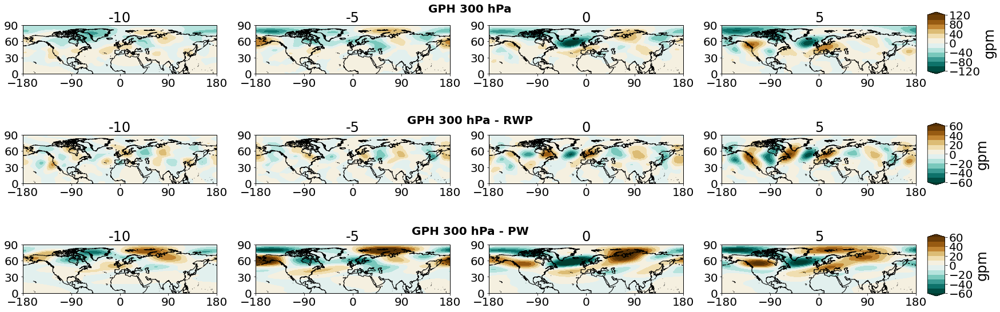

In [139]:
fig = plt.figure(figsize=(28,10))
axs=[]
for i in range(1,13):
        axs.append(fig.add_subplot(3,4,i, projection=prj))
var_map_set = [z_map, z_RWP_map, z_PW_map]
#welch_map_set=[z_map_welch]
Unit=['gpm','gpm','gpm']

cmap=[BrBG_cmap, BrBG_cmap, BrBG_cmap]
levels= [np.linspace(-120,120,13),np.linspace(-60,60,13), np.linspace(-60,60,13)]
y_len=[0.71,0.44, 0.17]

k=0
for j in range(0,3):
    for i in range(0,4):
        contf= axs[k].contourf(X,Y,np.c_[var_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(), var_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]], cmap=cmap[j], transform=prj, levels=levels[j], extend='both')
        #axs[i].contourf(X, Y,np.c_[welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(),welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]] < low_p_val,1, hatches=['','**'], alpha=0)
        #axs[i].contourf(X, Y,np.c_[welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(),welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]] < upp_p_val,1, hatches=['','..'], alpha=0)
        axs[k].set_title(var_lag_set[i])
        k=k+1
        if i==3:
            cb_ax = fig.add_axes([0.91, y_len[j], 0.015, 0.15])
            cb = plt.colorbar(contf, cax=cb_ax)
            cb.set_label(label=Unit[j], size='large')


for ax in axs:
    ax.coastlines('50m')
    #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
    #ax.text(0.5, -0.3, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
    #ax.gridlines()
    ax.set_extent([-180, 180, 0, 90], prj)
    ax.set_xticks([-180, -90,0, 90, 180],crs=prj)
    ax.set_yticks([0, 30, 60, 90],crs=prj)

#cb_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])
#cb = fig.colorbar(contf, cax=cb_ax, orientation='horizontal')
#cb.ax.tick_params(labelsize=20)
#cb.set_label(label='gpm', size='large', weight='bold')

plt.figtext(0.513,0.88,"GPH 300 hPa", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.61,"GPH 300 hPa - RWP", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.34,"GPH 300 hPa - PW", ha="center", va="top", fontsize=20, weight='bold')
#plt.tight_layout()
plt.savefig('ERA5_cold_composite_1979_2019_GPH_RWP_PW_maps_Atl_abs_values_10_5_0_5.pdf')


## All parameters together on maps with -5,0,+5 days: probability values

/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should b

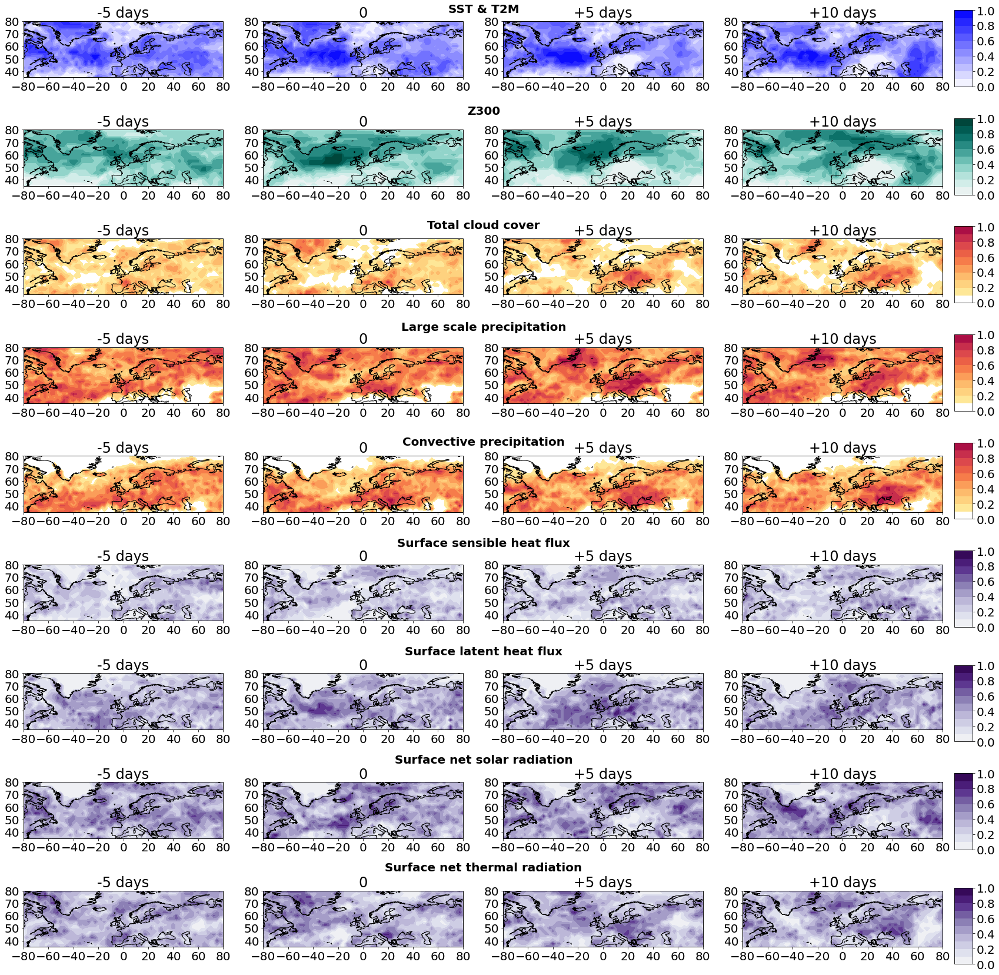

In [373]:
# Make maps before, during and after SST event for different variables:
triple_lag = [-5,0,5,10]
fig = plt.figure(figsize=(28,30))
axs=[]
for i in range(1,37):
        axs.append(fig.add_subplot(9,4,i, projection=prj))
var_map_set = [sst_t2m_map_prob_neg, z_map_prob_neg, tcc_map_prob_neg, lsp_map_prob_neg, cp_map_prob_neg, shf_map_prob_neg, lhf_map_prob_neg, snsr_map_prob_neg, sntr_map_prob_neg]
#welch_map_set=[sst_t2m_map_welch, z_map_welch, shf_map_welch,  lhf_map_welch, tcc_map_welch]
var_lag_set = ['-5 days','0','+5 days','+10 days']

# Adjust colormaps
bwr_cmap = plt.cm.get_cmap('bwr').reversed()
BrBG_cmap = plt.cm.get_cmap('BrBG')
spectral = plt.cm.get_cmap('Spectral', 256).reversed()
PuOr_cmap = plt.cm.get_cmap('PuOr')

spectral_white = spectral(np.linspace(0.5, 1, 256))
white = np.array([1., 1., 1., 1.])
spectral_white[:28, :] = white

bwr_cmap_cm= ListedColormap(bwr_cmap(np.linspace(0.5, 1, 256)))
BrBG_cmap_cm= ListedColormap(BrBG_cmap(np.linspace(0.5, 1, 256)))
spectral_white_pos_cm= ListedColormap(spectral_white)
PuOr_cmape_cm= ListedColormap(PuOr_cmap(np.linspace(0.5, 1, 256)))
#spectral_white= ListedColormap(["darkred", "red","darkorange", "orange","gold", "white","lightcyan","cyan", "darkcyan","blue","darkblue"])

cmap=[bwr_cmap_cm,BrBG_cmap_cm,spectral_white_pos_cm,spectral_white_pos_cm,spectral_white_pos_cm,PuOr_cmape_cm,PuOr_cmape_cm,PuOr_cmape_cm,PuOr_cmape_cm]
y_len=[0.815, 0.73, 0.645, 0.56,0.475,0.39,0.30,0.215,0.125]
levels_prob= np.linspace(0,1,11)
k=0
for j in range(0,9):
    for i in range(0,4):
        contf= axs[k].contourf(X,Y,np.c_[var_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(), var_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]], cmap=cmap[j], transform=prj, levels=levels_prob)
        #axs[i].contourf(X, Y,np.c_[welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(),welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]] < low_p_val,1, hatches=['','**'], alpha=0)
        #axs[i].contourf(X, Y,np.c_[welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze(),welch_map_set[j][0].sel(lead_lag=slice(triple_lag[i],triple_lag[i])).squeeze()[:,0]] < upp_p_val,1, hatches=['','..'], alpha=0)
        axs[k].set_title(var_lag_set[i])
        k=k+1
        if i==3:
            cb_ax = fig.add_axes([0.91, y_len[j], 0.015, 0.06])
            cb = plt.colorbar(contf, cax=cb_ax)
            #cb.set_label(label=Unit[j], size='large')

for ax in axs:
    ax.coastlines('50m')
    #ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center', rotation='vertical', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
    #ax.text(0.5, -0.3, 'Longitude', va='bottom', ha='center', rotation='horizontal', rotation_mode='anchor', fontsize =20, transform=ax.transAxes)
    #ax.gridlines()
    ax.set_extent([-80, 80, 35, 80], prj)
    ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
    ax.set_yticks([40, 50, 60, 70,80],crs=prj)

plt.figtext(0.513,0.88,"SST & T2M", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.80,"Z300", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.71,"Total cloud cover", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.63,"Large scale precipitation", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.54,"Convective precipitation", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.46,"Surface sensible heat flux", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.375,"Surface latent heat flux", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.29,"Surface net solar radiation", ha="center", va="top", fontsize=20, weight='bold')
plt.figtext(0.513,0.205,"Surface net thermal radiation", ha="center", va="top", fontsize=20, weight='bold')


plt.savefig('ERA5_cold_composite_1979_2019_different_params_maps_Atl_prob_neg_values.pdf')



# Animations

## Make animation with SST/T2M (coloured) and Z300 (contour) from -60 to 60 for COLD events

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


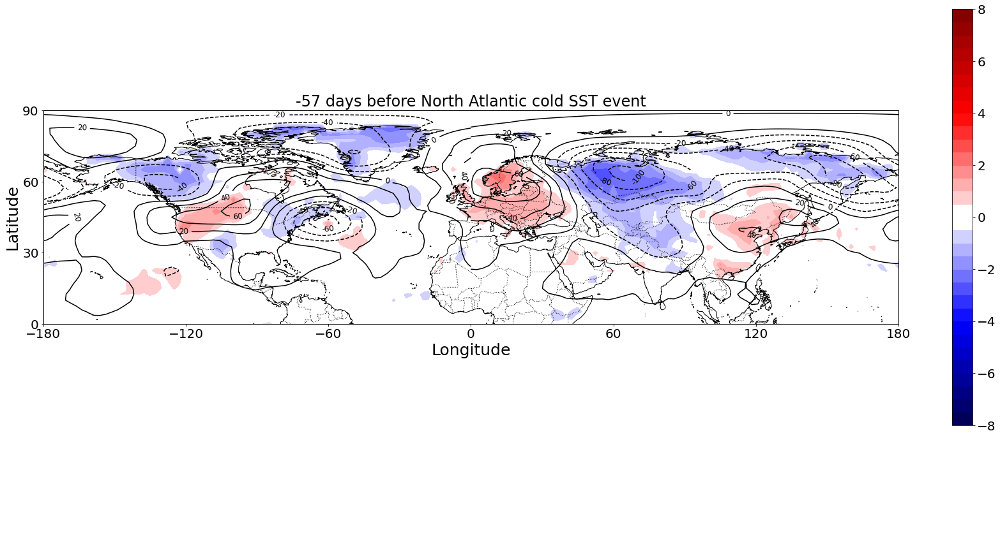

In [88]:
#SST_T2M_10_lags_mean=[]
#SST_T2M_10_lags_welch=[]
#for i in range(len(SST_T2M_10_lags)):
#    SST_T2M_10_lags_mean.append(SST_T2M_10_lags[i].mean('time'))
#    SST_T2M_10_lags_welch.append(xr.DataArray(data=(ttest_ind(SST_T2M_10_lags[i], SST_T2M_medium_lags[i], equal_var=False).pvalue), dims=[ "lat", "lon"], coords=dict(lon = SST_T2M_10_lags[0].lon,lat= SST_T2M_10_lags[0].lat, lead_lag= SST_T2M_10_lags[i].lead_lag)))

#SST_T2M_10_lags_mean_combined = xr.concat(SST_T2M_10_lags_mean, dim='lead_lag')
#SST_T2M_10_lags_welch_combined = xr.concat(SST_T2M_10_lags_welch, dim='lead_lag')

#z_10_lags_mean= []
#for i in range(len(z_10_lags)):
#        z_10_lags_mean.append(z_10_lags[i].mean('time')/9.81)
#z_10_lags_mean_combined = xr.concat(z_10_lags_mean, dim='lead_lag')



##### Plot global map

fig = plt.figure(figsize=(30,12))
ax = plt.axes(projection=prj)
ax.coastlines('50m')
clevels = np.linspace(-160,160,17)
levels = np.linspace(-8,8,33)
lon=np.linspace(0,360,144)
X1, Y1 = np.meshgrid(lon, ds_ERA5_z.latitude)

contf= ax.contourf(X,Y, np.c_[sst_t2m_map[0][0,:,:], sst_t2m_map[0][0,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels)
cont= ax.contour(X1,Y1, z_map[0][0,:,:], transform=prj, levels=clevels)
plt.colorbar(contf)

def animate(i):
    ax.clear()
    ax.coastlines('50m')
    contf= ax.contourf(X,Y, np.c_[sst_t2m_map[0][i,:,:], sst_t2m_map[0][i,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels, extend='both')
    ax.set_xticks([-180, -120, -60,0, 60, 120, 180],crs=prj)
    ax.set_yticks([-90, -60, -30, 0, 30, 60, 90],crs=prj)
    ax.set_xlabel('Longitude', fontsize=25)
    ax.set_ylabel('Latitude', fontsize=25)
    ax.add_feature(cartopy.feature.BORDERS, ls=':')
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.05), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.05)],1, hatches=['','**'], alpha=0)
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.1), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.1)],1, hatches=['','..'], alpha=0)
    cont= ax.contour(X1,Y1, z_map[0][i,:,:], transform=prj, levels=clevels, colors='black')
    ax.clabel(cont, inline=True, fmt='%1.0f', fontsize=12)
    ax.set_extent([-180, 180, 0, 90],prj)

    if i< 57: 
        ax.set_title(str(i-57)+ ' days before North Atlantic cold SST event')
    elif i == 57:
        ax.set_title(str(i-57))
    else: 
        ax.set_title(str(i-57)+ ' days after North Atlantic cold SST event')
    return cont, contf

anim = animation.FuncAnimation(fig,animate, save_count=115)
writergif = animation.PillowWriter(fps=2) 
anim.save('SST_T2M_Z300_cold_events_global_anim.gif', writer=writergif)

## Make animation with SST/T2M (coloured) and Z300 (contour) from -60 to 60 for COLD events: North Atlantic - European sector only

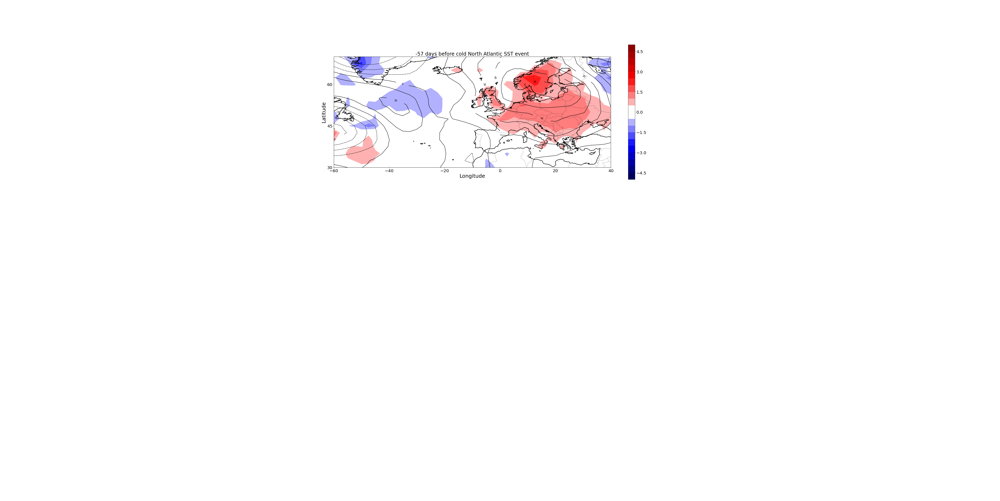

In [75]:
##### Plot North Atlantic 

fig = plt.figure(figsize=(30,12))
ax = plt.axes(projection=cartopy.crs.PlateCarree())
clevels = np.linspace(-150,150,21)
levels = np.linspace(-5,5,21)
contf= ax.contourf(X,Y, np.c_[sst_t2m_map[0][0,:,:], sst_t2m_map[0][0,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels)
cont= ax.contour(X1,Y1, z_map[0][0,:,:], levels=clevels, transform=prj, colors='black')
plt.colorbar(contf)
#ax.add_feature(cartopy.feature.LAND, color='black')
ax.add_feature(cartopy.feature.BORDERS)
ax.coastlines('50m')

def animate(i):
    ax.clear()
    ax.coastlines('50m', lw=2)
    ax.set_xticks([-60,-40,-20,0, 20, 40, 60],crs=prj)
    ax.set_yticks([0,30,45,60,75],crs=prj)
    ax.set_xlabel('Longitude', fontsize=25)
    ax.set_ylabel('Latitude', fontsize=25)
    ax.add_feature(cartopy.feature.BORDERS, ls=':')
    contf= ax.contourf(X,Y, np.c_[sst_t2m_map[0][i,:,:], sst_t2m_map[0][i,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels, extend='both')
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.05), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.05)],1, hatches=['','**'], alpha=0)
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.1), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.1)],1, hatches=['','..'], alpha=0)
    cont= ax.contour(X1,Y1, z_map[0][i,:,:], levels=clevels, transform=prj, colors='black')
    ax.clabel(cont, inline=True, fmt='%1.0f', fontsize=12)
    ax.set_extent([-60, 40, 30, 70],prj)


    if i< 57: 
        ax.set_title(str(i-57)+ ' days before cold North Atlantic SST event')
    elif i == 57:
        ax.set_title(str(i-57))
    else: 
        ax.set_title(str(i-57)+ ' days after cold North Atlantic SST event')
    return cont, contf

anim = animation.FuncAnimation(fig,animate, save_count=115)

# Save as gif
writergif = animation.PillowWriter(fps=2) 
#anim.save('SST_T2M_Z300_cold_events_NA_anim.gif', writer=writergif)

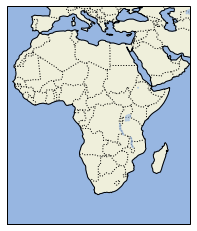

In [86]:
ax = plt.axes(projection=cartopy.crs.PlateCarree())
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.OCEAN)
ax.add_feature(cartopy.feature.COASTLINE)
ax.add_feature(cartopy.feature.BORDERS, linestyle=':')
ax.add_feature(cartopy.feature.LAKES, alpha=0.5)
ax.set_extent([-20, 60, -40, 40])
plt.show()


## Make animation with SST/T2M (coloured) and Z300 (contour) from -60 to 60 for WARM events

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


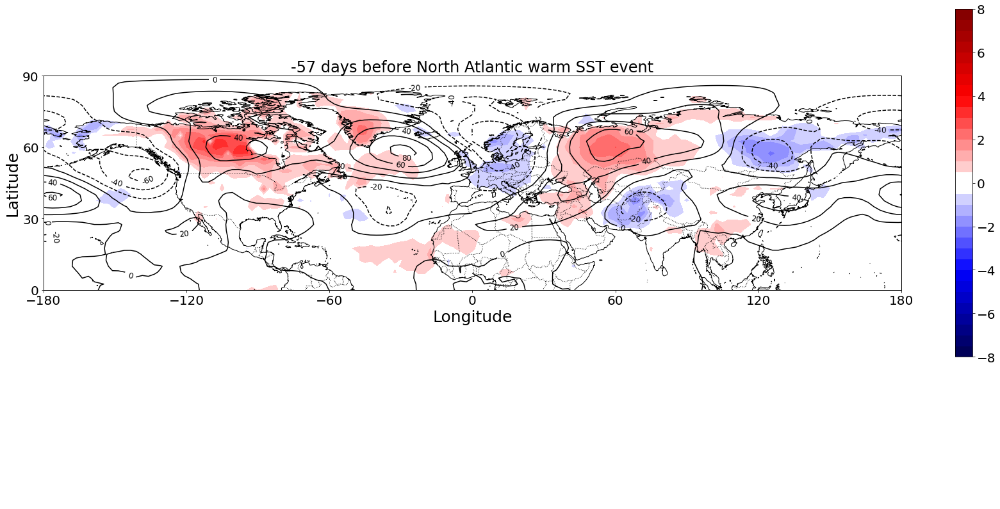

In [86]:
#SST_T2M_90_lags_mean=[]
#SST_T2M_90_lags_welch=[]
#for i in range(len(SST_T2M_90_lags)):
#    SST_T2M_90_lags_mean.append(SST_T2M_90_lags[i].mean('time'))
#    SST_T2M_90_lags_welch.append(xr.DataArray(data=(ttest_ind(SST_T2M_90_lags[i], SST_T2M_medium_lags[i], equal_var=False).pvalue), dims=[ "lat", "lon"], coords=dict(lon = SST_T2M_90_lags[0].lon,lat= SST_T2M_90_lags[0].lat, lead_lag= SST_T2M_90_lags[i].lead_lag)))

#SST_T2M_90_lags_mean_combined = xr.concat(SST_T2M_90_lags_mean, dim='lead_lag')
#SST_T2M_90_lags_welch_combined = xr.concat(SST_T2M_90_lags_welch, dim='lead_lag')

#z_90_lags_mean= []
#for i in range(len(z_90_lags)):
#        z_90_lags_mean.append(z_90_lags[i].mean('time')/9.81)
#z_90_lags_mean_combined = xr.concat(z_90_lags_mean, dim='lead_lag')


##### Plot global map

fig = plt.figure(figsize=(30,10))
ax = plt.axes(projection=prj)
ax.coastlines('50m')
clevels = np.linspace(-160,160,17)
levels = np.linspace(-8,8,33)
lon=np.linspace(0,360,144)
X1, Y1 = np.meshgrid(lon, ds_ERA5_z.latitude)

contf= ax.contourf(X,Y, np.c_[sst_t2m_map[1][0,:,:], sst_t2m_map[1][0,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels)
cont= ax.contour(X1,Y1, z_map[1][0,:,:], transform=prj, levels=clevels)
plt.colorbar(contf)

def animate(i):
    ax.clear()
    ax.coastlines('50m')
    contf= ax.contourf(X,Y, np.c_[sst_t2m_map[1][i,:,:], sst_t2m_map[1][i,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels, extend='both')
    ax.set_xticks([-180, -120, -60,0, 60, 120, 180],crs=prj)
    ax.set_yticks([-90, -60, -30, 0, 30, 60, 90],crs=prj)
    ax.set_xlabel('Longitude', fontsize=25)
    ax.set_ylabel('Latitude', fontsize=25)
    ax.add_feature(cartopy.feature.BORDERS, ls=':')
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.05), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.05)],1, hatches=['','**'], alpha=0)
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.1), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.1)],1, hatches=['','..'], alpha=0)
    cont= ax.contour(X1,Y1, z_map[1][i,:,:], transform=prj, levels=clevels, colors='black')
    ax.clabel(cont, inline=True, fmt='%1.0f', fontsize=12)
    ax.set_extent([-180, 180, 0, 90],prj)

    if i< 57: 
        ax.set_title(str(i-57)+ ' days before North Atlantic warm SST event')
    elif i == 57:
        ax.set_title(str(i-57))
    else: 
        ax.set_title(str(i-57)+ ' days after North Atlantic warm SST event')
    return cont, contf

anim = animation.FuncAnimation(fig,animate, save_count=115)
writergif = animation.PillowWriter(fps=2) 
anim.save('SST_T2M_Z300_warm_events_NH_anim.gif', writer=writergif)

## Make animation with SST/T2M (coloured) and Z300 (contour) from -60 to 60 for WARM events: North Atlantic - European sector only

/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/jukrueger/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)


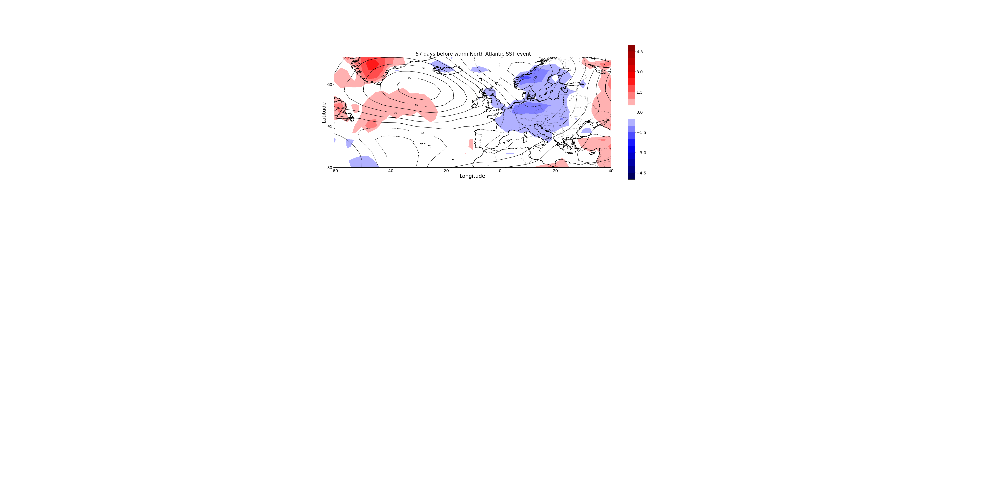

In [81]:
##### Plot North Atlantic 

fig = plt.figure(figsize=(30,12))
ax = plt.axes(projection=cartopy.crs.PlateCarree())
clevels = np.linspace(-150,150,21)
levels = np.linspace(-5,5,21)
contf= ax.contourf(X,Y, np.c_[sst_t2m_map[1][0,:,:], sst_t2m_map[1][0,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels)
cont= ax.contour(X1,Y1, z_map[1][0,:,:], levels=clevels, transform=prj, colors='black')
plt.colorbar(contf)
#ax.add_feature(cartopy.feature.LAND, color='black')
ax.add_feature(cartopy.feature.BORDERS)
ax.coastlines('50m')

def animate(i):
    ax.clear()
    ax.coastlines('50m', lw=2)
    ax.set_xticks([-60,-40,-20,0, 20, 40, 60],crs=prj)
    ax.set_yticks([0,30,45,60,75],crs=prj)
    ax.set_xlabel('Longitude', fontsize=25)
    ax.set_ylabel('Latitude', fontsize=25)
    ax.add_feature(cartopy.feature.BORDERS, ls=':')
    contf= ax.contourf(X,Y, np.c_[sst_t2m_map[1][i,:,:], sst_t2m_map[1][i,:,0]], cmap=seismic_white_cm, transform=prj, levels=levels, extend='both')
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.05), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.05)],1, hatches=['','**'], alpha=0)
    #ax.contourf(X,Y, np.c_[(SST_T2M_10_lags_welch_combined[i,:,:]< 0.1), (SST_T2M_10_lags_welch_combined[i,:,0]< 0.1)],1, hatches=['','..'], alpha=0)
    cont= ax.contour(X1,Y1, z_map[1][i,:,:], levels=clevels, transform=prj, colors='black')
    ax.clabel(cont, inline=True, fmt='%1.0f', fontsize=12)
    ax.set_extent([-60, 40, 30, 70],prj)


    if i< 57: 
        ax.set_title(str(i-57)+ ' days before warm North Atlantic SST event')
    elif i == 57:
        ax.set_title(str(i-57))
    else: 
        ax.set_title(str(i-57)+ ' days after warm North Atlantic SST event')
    return cont, contf

anim = animation.FuncAnimation(fig,animate, save_count=115)

# Save as gif
writergif = animation.PillowWriter(fps=2) 
anim.save('SST_T2M_Z300_warm_events_NA_anim.gif', writer=writergif)

## Appendix: Case studies of heat wave years 1992, 1994, 2003, 2010, 2015, 2018 & Composite of older wind speed maximum plot

* U + V - 300hPa

In [866]:
#### Load U and V and calc total wind speed
U_tot = xr.ufuncs.sqrt(ds_ERA5_u.u *ds_ERA5_u.u + ds_ERA5_v.v*ds_ERA5_v.v)
year=['1992','1994','2003','2010','2015','2018']
U_tot_May_append =[]
U_tot_Jun_append =[]
U_tot_Jul_append =[]
U_tot_Aug_append =[]
for i in range(0,len(year)):
    U_tot_May_append.append(U_tot.sel(time=slice(year[i]+'-05-01T06:00:00',year[i]+'-05-31T06:00:00')).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time'))
    U_tot_Jun_append.append(U_tot.sel(time=slice(year[i]+'-06-01T06:00:00',year[i]+'-06-30T06:00:00')).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time'))
    U_tot_Jul_append.append(U_tot.sel(time=slice(year[i]+'-07-01T06:00:00',year[i]+'-07-31T06:00:00')).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time'))
    U_tot_Aug_append.append(U_tot.sel(time=slice(year[i]+'-08-01T06:00:00',year[i]+'-08-31T06:00:00')).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time'))

#### produce meridional wind anomalies for 1992, 1994, 2003, 2010, 2015 and 2018
v_clim = ds_ERA5_v.v.groupby('time.season').mean('time')
v_clim_month = ds_ERA5_v.v.groupby('time.month').mean('time')

v_anom_May_append=[]
v_anom_Jun_append=[]
v_anom_Jul_append=[]
v_anom_Aug_append=[]
for i in range(0,len(year)):
    v_anom_May_append.append(ds_ERA5_v.v.sel(time=slice(year[i]+'-05-01T06:00:00',year[i]+'-05-31T06:00:00')).mean('time') - v_clim_month.sel(month=5))
    v_anom_Jun_append.append(ds_ERA5_v.v.sel(time=slice(year[i]+'-06-01T06:00:00',year[i]+'-06-30T06:00:00')).mean('time') - v_clim_month.sel(month=6))
    v_anom_Jul_append.append(ds_ERA5_v.v.sel(time=slice(year[i]+'-07-01T06:00:00',year[i]+'-07-31T06:00:00')).mean('time') - v_clim_month.sel(month=7))
    v_anom_Aug_append.append(ds_ERA5_v.v.sel(time=slice(year[i]+'-08-01T06:00:00',year[i]+'-08-31T06:00:00')).mean('time') - v_clim_month.sel(month=8))

v_anom_set=[]
for i in range(0,6):
    v_anom_set.append((v_anom_May_append[i] + v_anom_Jun_append[i] + v_anom_Jul_append[i] + v_anom_Aug_append[i])/4)

* Z - 300hPa

In [867]:
z_clim_month = ds_ERA5_z.z.groupby('time.month').mean('time')
z_clim = ds_ERA5_z.z.groupby('time.season').mean('time')

z_May_append =[]
z_Jun_append =[]
z_Jul_append =[]
z_Aug_append =[]
for i in range(0,len(year)):
    z_May_append.append(ds_ERA5_z.z.sel(time=slice(year[i]+'-05-01T06:00:00',year[i]+'-05-31T06:00:00')).mean('time') - z_clim_month.sel(month=5))
    z_Jun_append.append(ds_ERA5_z.z.sel(time=slice(year[i]+'-06-01T06:00:00',year[i]+'-06-30T06:00:00')).mean('time') - z_clim_month.sel(month=6))
    z_Jul_append.append(ds_ERA5_z.z.sel(time=slice(year[i]+'-07-01T06:00:00',year[i]+'-07-31T06:00:00')).mean('time') - z_clim_month.sel(month=7))
    z_Aug_append.append(ds_ERA5_z.z.sel(time=slice(year[i]+'-08-01T06:00:00',year[i]+'-08-31T06:00:00')).mean('time') - z_clim_month.sel(month=8))
    
z_anom_1992 = (z_May_append[0] +  z_Jun_append[0] + z_Jul_append[0] + z_Aug_append[0])/4
z_anom_1994 = (z_May_append[1] +  z_Jun_append[1] + z_Jul_append[1] + z_Aug_append[1])/4
z_anom_2003 = (z_May_append[2] +  z_Jun_append[2] + z_Jul_append[2] + z_Aug_append[2])/4
z_anom_2010 = (z_May_append[3] +  z_Jun_append[3] + z_Jul_append[3] + z_Aug_append[3])/4
z_anom_2015 = (z_May_append[4] +  z_Jun_append[4] + z_Jul_append[4] + z_Aug_append[4])/4
z_anom_2018 = (z_May_append[5] +  z_Jun_append[5] + z_Jul_append[5] + z_Aug_append[5])/4
z_anom = [z_anom_1992, z_anom_1994, z_anom_2003, z_anom_2010, z_anom_2015, z_anom_2018]

* SST & T2M

In [875]:
# Calc detrended monthly MJJA anomalies
# ...only for heat wave seasons
# Calc climatology
sst_t2m_detrend_clim = sst_t2m_detrend_xr.groupby('time.season').mean('time')
sst_t2m_detrend_clim_month = sst_t2m_detrend_xr.groupby('time.month').mean('time')

sst_t2m_May_append =[]
sst_t2m_Jun_append =[]
sst_t2m_Jul_append =[]
sst_t2m_Aug_append =[]
year=['1992','1994','2003','2010','2015','2018']
for i in range(0,len(year)):
        sst_t2m_May_append.append(sst_t2m_detrend_xr.sel(time=slice(year[i]+'-05-01 11:30:00',year[i]+'-05-31 11:30:00')).mean('time') - sst_t2m_detrend_clim_month.sel(month=5))
        sst_t2m_Jun_append.append(sst_t2m_detrend_xr.sel(time=slice(year[i]+'-06-01 11:30:00',year[i]+'-06-30 11:30:00')).mean('time') - sst_t2m_detrend_clim_month.sel(month=6))
        sst_t2m_Jul_append.append(sst_t2m_detrend_xr.sel(time=slice(year[i]+'-07-01 11:30:00',year[i]+'-07-31 11:30:00')).mean('time') - sst_t2m_detrend_clim_month.sel(month=7))
        sst_t2m_Aug_append.append(sst_t2m_detrend_xr.sel(time=slice(year[i]+'-08-01 11:30:00',year[i]+'-08-31 11:30:00')).mean('time') - sst_t2m_detrend_clim_month.sel(month=8))

sst_t2m_anom=[]
for i in range(0,6):
    sst_t2m_anom.append((sst_t2m_May_append[i] + sst_t2m_Jun_append[i] + sst_t2m_Jul_append[i] + sst_t2m_Aug_append[i])/4)

/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should b

<Figure size 864x720 with 0 Axes>

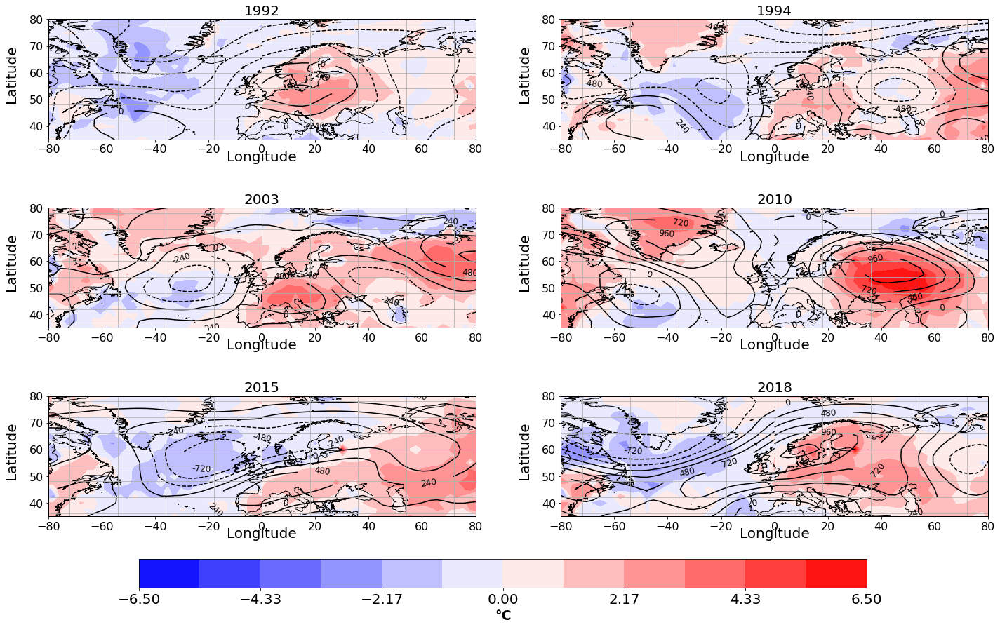

In [868]:
# Show North Atlantic European sector
fig = plt.figure(figsize=(12,10))
prj = ccrs.PlateCarree()
X, Y = np.linspace(0,360, 144), z_anom_2018.latitude
l=np.linspace(0,360,145)
clevels= np.linspace(-1200,1200, 11)
levels = np.linspace(-6.5,6.5,13)
fig= plt.figure(figsize=(24,14))
titles=['1992','1994','2003','2010','2015','2018']
axs=[]
for i in range(1,7):
    axs.append(fig.add_subplot(3,2,i, projection=prj))
for i in range(0,6):
    cont= axs[i].contourf(X,Y,sst_t2m_anom[i], cmap='bwr', transform=prj, levels=levels)
    c = axs[i].contour(X,Y, z_anom[i],colors='black', transform=prj,levels = clevels)
    axs[i].clabel(c, inline=True, fmt='%1.0f', fontsize=12)
    axs[i].set_title(titles[i], size=20)
for ax in axs:
    ax.coastlines('50m')
    ax.set_extent([-80, 80, 35, 80], ccrs.PlateCarree())
    ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        fontsize =20, transform=ax.transAxes)
    ax.text(0.5, -0.2, 'Longitude', va='bottom', ha='center',
        rotation='horizontal', rotation_mode='anchor',
        fontsize =20, transform=ax.transAxes)
    ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
    ax.set_yticks([40, 50, 60, 70,80],crs=prj)
    ax.gridlines()


cb_ax = fig.add_axes([0.2, 0.05, 0.6, 0.04])
cb = fig.colorbar(cont, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='°C', size='large', weight='bold')
plt.savefig('ERA5_sst_t2m_z300_anom_92_94_03_10_15_18.pdf')

In [869]:
#### Make composites with total wind speed U tot
U_tot_10 = U_tot.where(U_tot.time == sst_deseason_Atl_10.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time')
U_tot_25 = U_tot.where(U_tot.time == sst_deseason_Atl_25.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time')
U_tot_25_std = U_tot.where(U_tot.time == sst_deseason_Atl_25.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').std('time')
U_tot_medium = U_tot.where(U_tot.time == sst_deseason_Atl_medium.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time')
U_tot_medium_std = U_tot.where(U_tot.time == sst_deseason_Atl_medium.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').std('time')/(xr.ufuncs.sqrt(len(sst_deseason_Atl_medium.time)))
U_tot_75 = U_tot.where(U_tot.time == sst_deseason_Atl_75.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time')
U_tot_75_std = U_tot.where(U_tot.time == sst_deseason_Atl_75.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').std('time')
U_tot_90 = U_tot.where(U_tot.time == sst_deseason_Atl_90.time).sel(latitude=slice(90.0,45.0)).idxmax(dim='latitude').mean('time')

U_comp_cold_diff = U_tot_25 - U_tot_medium
U_comp_warm_diff = U_tot_75 - U_tot_medium
U_cold_medium_std_diff =  U_tot_medium_std
U_warm_medium_std_diff =  - U_tot_medium_std

/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/home/shkjkrug/miniconda3/envs/py3_std/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should b

<Figure size 864x720 with 0 Axes>

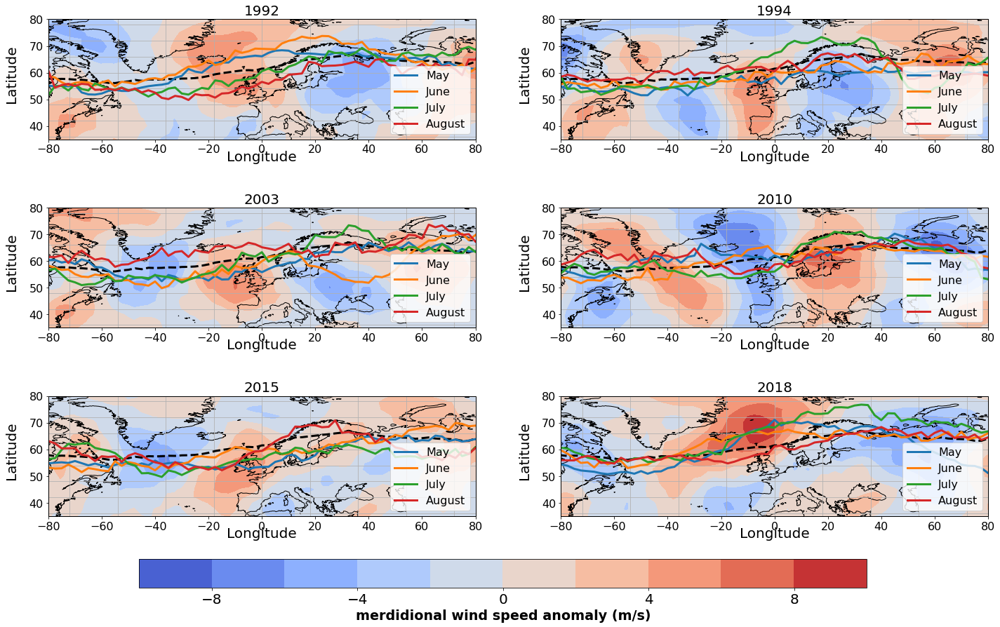

In [870]:
# Show North Atlantic European sector
fig = plt.figure(figsize=(12,10))
prj = ccrs.PlateCarree()
X, Y = np.linspace(0,360, 144), v_anom_2018.latitude
l=np.linspace(0,360,145)
levels= np.linspace(-10,10, 11)
fig= plt.figure(figsize=(24,14))
titles=['1992','1994','2003','2010','2015','2018']
axs=[]
for i in range(1,7):
    axs.append(fig.add_subplot(3,2,i, projection=prj))
for i in range(0,6):
    p2 = axs[i].plot(l, np.r_[U_tot_medium, U_tot_medium[0]], transform=prj, color='black', linewidth=3, linestyle='--')
    cont = axs[i].contourf(X,Y, v_anom_set[i], cmap='coolwarm', transform=prj,levels = levels)
    axs[i].set_title(titles[i], size=20)
    axs[i].plot(l, np.r_[U_tot_May_append[i], U_tot_May_append[i][0]], transform=prj, linewidth=3, linestyle='-', label='May')
    axs[i].plot(l, np.r_[U_tot_Jun_append[i], U_tot_Jun_append[i][0]], transform=prj, linewidth=3, linestyle='-', label='June')
    axs[i].plot(l, np.r_[U_tot_Jul_append[i], U_tot_Jul_append[i][0]], transform=prj, linewidth=3, linestyle='-', label='July')
    axs[i].plot(l, np.r_[U_tot_Aug_append[i], U_tot_Aug_append[i][0]], transform=prj, linewidth=3, linestyle='-', label='August')
    axs[i].legend()
for ax in axs:
    ax.coastlines('50m')
    ax.set_extent([-80, 80, 35, 80], ccrs.PlateCarree())
    ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        fontsize =20, transform=ax.transAxes)
    ax.text(0.5, -0.2, 'Longitude', va='bottom', ha='center',
        rotation='horizontal', rotation_mode='anchor',
        fontsize =20, transform=ax.transAxes)
    ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
    ax.set_yticks([40, 50, 60, 70,80],crs=prj)
    ax.gridlines()


cb_ax = fig.add_axes([0.2, 0.05, 0.6, 0.04])
cb = fig.colorbar(cont, cax=cb_ax, orientation='horizontal')
cb.ax.tick_params(labelsize=20)
cb.set_label(label='merdidional wind speed anomaly (m/s)', size='large', weight='bold')
plt.savefig('ERA5_v_anom_U_tot_max_lat_92_94_03_10_15_18.pdf')

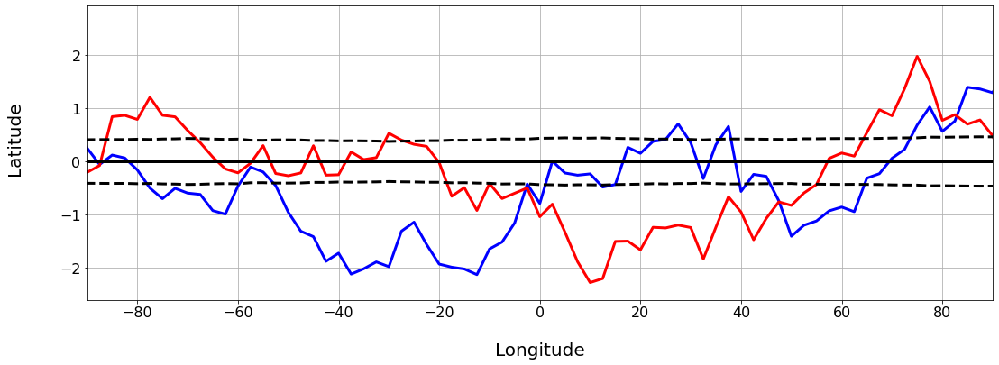

In [105]:
U_comp_cold_diff_wrapped = wrapTo180(U_comp_cold_diff,U_comp_cold_diff.longitude)
U_comp_warm_diff_wrapped = wrapTo180(U_comp_warm_diff,U_comp_warm_diff.longitude)
U_cold_medium_std_diff_wrapped = wrapTo180(U_cold_medium_std_diff,U_cold_medium_std_diff.longitude)
U_warm_medium_std_diff_wrapped = wrapTo180(U_warm_medium_std_diff,U_warm_medium_std_diff.longitude)

# Show North Atlantic European sector
fig = plt.figure(figsize=(18,6))
prj = ccrs.PlateCarree()
#levels= np.linspace(-10,10, 11)
#titles=['1992','1994','2003','2010','2015','2018']
x1, y1 = [-180,180], [0, 0]

axs=[]
for i in range(1,2):
    axs.append(fig.add_subplot(1,1,i))
for i in range(0,1):
    p1 = axs[i].plot(U_comp_cold_diff_wrapped.longitude, U_comp_cold_diff_wrapped, color='blue', linewidth=3)
    p2 = axs[i].plot(U_comp_cold_diff_wrapped.longitude, U_comp_warm_diff_wrapped, color='red', linewidth=3, linestyle='-')
    p3 = axs[i].plot(U_comp_cold_diff_wrapped.longitude, U_cold_medium_std_diff_wrapped, color='black', linewidth=3, linestyle='--')
    p3 = axs[i].plot(U_comp_cold_diff_wrapped.longitude, U_warm_medium_std_diff_wrapped, color='black', linewidth=3, linestyle='--')
    axs[i].plot(x1, y1, color='black', linestyle='-', linewidth=3)

    #axs[i].set_title(titles[i], size=20)

for ax in axs:
    #ax.set_extent([-80, 80, 35, 80], ccrs.PlateCarree())
    ax.text(-0.07, 0.55, 'Latitude', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        fontsize =20, transform=ax.transAxes)
    ax.text(0.5, -0.2, 'Longitude', va='bottom', ha='center',
        rotation='horizontal', rotation_mode='anchor',
        fontsize =20, transform=ax.transAxes)
    ax.set_xlim([-90, 90])

    #ax.set_xticks([-80, -60, -40, -20,0,20, 40, 60, 80],crs=prj)
    #ax.set_yticks([40, 50, 60, 70,80],crs=prj)
    ax.grid()

plt.savefig('ERA5_U_tot_cold_warm_medium_composite.pdf')
#cb_ax = fig.add_axes([0.2, 0.05, 0.6, 0.04])
#cb = fig.colorbar(cont, cax=cb_ax, orientation='horizontal')
#cb.ax.tick_params(labelsize=20)
#cb.set_label(label='merdidional wind speed anomaly (m/s)', size='large', weight='bold')